https://nbviewer.jupyter.org/github/barbagroup/CFDPython/blob/master/lessons/01_Step_1.ipynb

In [1]:
# Remember: comments in python are denoted by the pound sign
import numpy                       #here we load numpy
from matplotlib import pyplot      #here we load matplotlib
import time, sys                   #and load some utilities

In [2]:
%matplotlib inline 

## 1.  1-D linear convection equation

Consider the 1-D linear convection equation: 
$$\frac{\partial u}{\partial t} + c\frac{\partial u}{\partial x} =0$$

With given initial conditions (understood as a wave), the equation represents the propagation of that initial wave with speed $c$, without change of shape. Let the initial condition be $u(x,0)=u_{0}(x)$. Then the exact solution of the equation is $u(x,t)=u_{0}(x−ct)$.

We discretize this equation in both space and time, using the Forward Difference scheme for the time derivative and the Backward Difference scheme for the space derivative. Consider discretizing the spatial coordinate $x$ into points that we index from $i=0$ to $N$, and stepping in discrete time intervals of size $\Delta t$.
After discretizing in space and time we have:



$$\frac{u^{n+1}_{i}- u^{n}_{i}}{\Delta t} +c\frac{u^{n}_{i}- u^{n}_{i-1}}{\Delta x} = 0 $$

Where $n$ and $n+1$ are two consecutive steps in time, while $i−1$ and i are two neighboring points of the discretized $x$ coordinate. If there are given initial conditions, then the only unknown in this discretization is $u^{n+1}_{}$. We can solve for our unknown to get an equation that allows us to advance in time, as follows:

$$u^{n+1}_{i} =  u^{n}_{i} -c \frac{\Delta t}{\Delta x} (u^{n}_{i}- u^{n}_{i-1}) $$


Now let's define a few variables; we want to define an evenly spaced grid of points within a spatial domain that is 2 units of length wide, i.e., $x\epsilon(0,2)$. We'll define a variable $nx$, which will be the number of grid points we want and $dx$ will be the distance between any pair of adjacent grid points.

In [3]:
nx = 41  # try changing this number from 41 to 81 and Run All ... what happens?
dx = 2 / (nx-1)
nt = 25    #nt is the number of timesteps we want to calculate
dt = .025  #dt is the amount of time each timestep covers (delta t)
c = 1      #assume wavespeed of c = 1

We also need to set up our initial conditions. The initial velocity $u_{0}$ is given as $u=2$ in the interval $0.5≤x≤1$ and $u=1$ everywhere else in $(0,2)$ (i.e., a hat function).

Here, we use the function ones() defining a numpy array which is nx elements long with every value equal to 1.

In [4]:
u = numpy.ones(nx)      #numpy function ones()
u[int(.5 / dx):int(1 / dx + 1)] = 2  #setting u = 2 between 0.5 and 1 as per our I.C.s
print(u)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


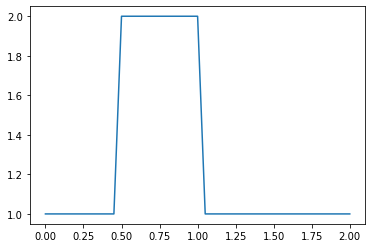

In [5]:
pyplot.plot(numpy.linspace(0, 2, nx), u);

In [6]:
un = numpy.ones(nx) #initialize a temporary array

for n in range(nt):  #loop for values of n from 0 to nt, so it will run nt times
    un = u.copy() ##copy the existing values of u into un
    for i in range(1, nx): ## you can try commenting this line and...
    #for i in range(nx): ## ... uncommenting this line and see what happens!
        u[i] = un[i] - c * dt / dx * (un[i] - un[i-1])

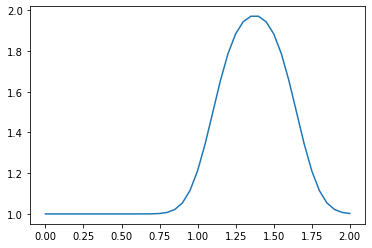

In [7]:
pyplot.plot(numpy.linspace(0, 2, nx), u);

## 2. Non-Linear Convection

Next, we consider the 1-D Non_linear convection equation: 
    
$$\frac{\partial u}{\partial t} + u\frac{\partial u}{\partial x} =0$$

Instead of a constant factor $c$ multiplying the second term, now we have the solution $u$ multiplying it. Thus, the second term of the equation is now nonlinear. We're going to use the same discretization as in above— forward difference in time and backward difference in space. Here is the discretized equation.

$$\frac{u^{n+1}_{i}- u^{n}_{i}}{\Delta t} +u^{n}_{i} \frac{u^{n}_{i}- u^{n}_{i-1}}{\Delta x} = 0$$

Solving for the only unknown term, $u^{n+1}_{i}$, yields:

$$u^{n+1}_{i} =  u^{n}_{i} - u^{n}_{i}\frac{\Delta t}{\Delta x} (u^{n}_{i}- u^{n}_{i-1}) $$


Then, we create the initial condition $u_{0}$ by initializing the array for the solution using $u=2$ @ $0.5≤x≤1$ and $u=1$ everywhere else in $(0,2)$ (i.e., a hat function).


In [8]:
import numpy                 # we're importing numpy 
from matplotlib import pyplot    # and our 2D plotting library
%matplotlib inline


nx = 41
dx = 2 / (nx - 1)
nt = 25    #nt is the number of timesteps we want to calculate
dt = .025  #dt is the amount of time each timestep covers (delta t)

u = numpy.ones(nx)      #as before, we initialize u with every value equal to 1.
u[int(.5 / dx) : int(1 / dx + 1)] = 2  #then set u = 2 between 0.5 and 1 as per our I.C.s

un = numpy.ones(nx) #initialize our placeholder array un, to hold the time-stepped solution
#print(un)

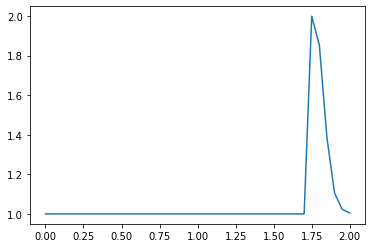

In [9]:
for n in range(nt):  #iterate through time
    un = u.copy() ##copy the existing values of u into un
    for i in range(1, nx):  ##now we'll iterate through the u array       
           u[i] = un[i] - un[i] * dt / dx * (un[i] - un[i-1]) 

        
pyplot.plot(numpy.linspace(0, 2, nx), u) ##Plot the results

##  Convergence and the CFL Condition

In [10]:
import numpy                 #numpy is a library for array operations akin to MATLAB
from matplotlib import pyplot    #matplotlib is 2D plotting library
%matplotlib inline

def linearconv(nx):
    dx = 2 / (nx - 1)
    nt = 20    #nt is the number of timesteps we want to calculate
    dt = .025  #dt is the amount of time each timestep covers (delta t)
    c = 1

    u = numpy.ones(nx)      #defining a numpy array which is nx elements long with every value equal to 1.
    u[int(.5/dx):int(1 / dx + 1)] = 2  #setting u = 2 between 0.5 and 1 as per our I.C.s

    un = numpy.ones(nx) #initializing our placeholder array, un, to hold the values we calculate for the n+1 timestep

    for n in range(nt):  #iterate through time
        un = u.copy() ##copy the existing values of u into un
        for i in range(1, nx):
            u[i] = un[i] - c * dt / dx * (un[i] - un[i-1])
        
    pyplot.plot(numpy.linspace(0, 2, nx), u);

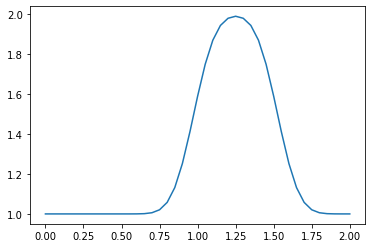

In [11]:
linearconv(41) #convection using 41 grid points

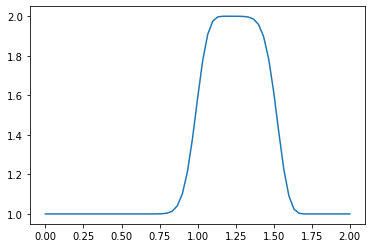

In [12]:
linearconv(61)

Here, there is still numerical diffusion present, but it is less severe.

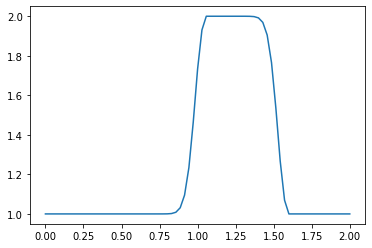

In [13]:
linearconv(71)

Here the same pattern is present -- the wave is more square than in the previous runs.

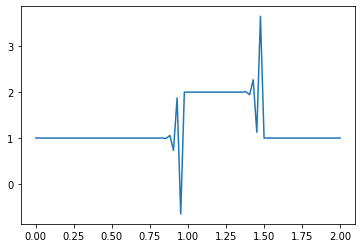

In [14]:
linearconv(85)

This doesn't look anything like our original hat function.

## What happened?

To answer that question, we have to think a little bit about what we're actually implementing in code.

In each iteration of our time loop, we use the existing data about our wave to estimate the speed of the wave in the subsequent time step. Initially, the increase in the number of grid points returned more accurate answers. There was less numerical diffusion and the square wave looked much more like a square wave than it did in our first example.

Each iteration of our time loop covers a time-step of length $\Delta t$, which we have been defining as 0.025

During this iteration, we evaluate the speed of the wave at each of the $x$ points we've created. In the last plot, something has clearly gone wrong.

What has happened is that over the time period $\Delta t$, the wave is travelling a distance which is greater than $dx$. The length $dx$ of each grid box is related to the number of total points nx, so stability can be enforced if the $\Delta t$ step size is calculated with respect to the size of $dx$.

$$\sigma =u \frac{ \Delta t}{\Delta x} ≤ \sigma_{max} $$
where $u$ is the speed of the wave; $\sigma$ is called the Courant number and the value of $\sigma_{max}$ that will ensure stability depends on the discretization used.

In a new version of our code, we'll use the CFL number to calculate the appropriate time-step dt depending on the size of $dx.$

In [15]:
import numpy
from matplotlib import pyplot

def linearconv(nx):
    dx = 2 / (nx - 1)
    nt = 20    #nt is the number of timesteps we want to calculate
    c = 1
    sigma = .5
    
    dt = sigma * dx

    u = numpy.ones(nx) 
    u[int(.5/dx):int(1 / dx + 1)] = 2

    un = numpy.ones(nx)

    for n in range(nt):  #iterate through time
        un = u.copy() ##copy the existing values of u into un
        for i in range(1, nx):
            u[i] = un[i] - c * dt / dx * (un[i] - un[i-1])
        
    pyplot.plot(numpy.linspace(0, 2, nx), u)


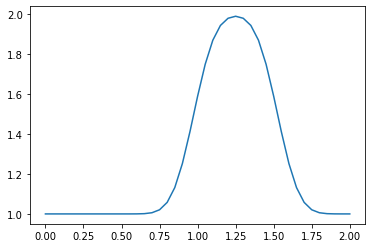

In [16]:
linearconv(41)

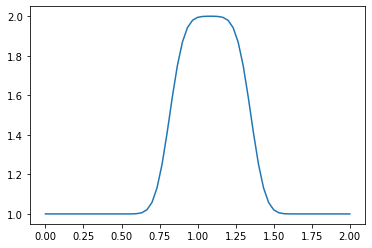

In [17]:
linearconv(61)

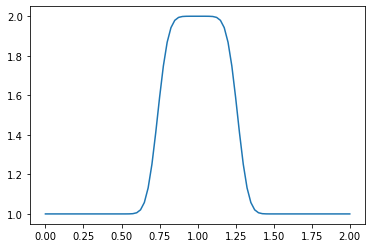

In [18]:
linearconv(81)

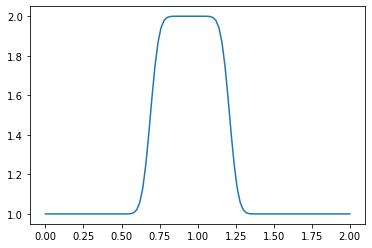

In [19]:
linearconv(101)

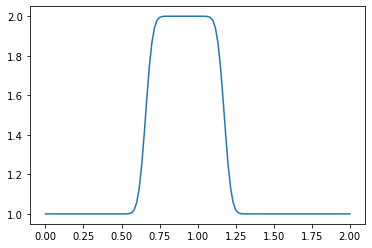

In [20]:
linearconv(121)

Notice that as the number of points $nx$ increases, the wave convects a shorter and shorter distance. The number of time iterations we have advanced the solution at is held constant at $nt = 20$, but depending on the value of $nx$ and the corresponding values of $dx$ and $dt$, a shorter time window is being examined overall.

## 3.  Diffusion Equation in 1-D

The one-dimensional diffusion equation is:

$$\frac{\partial u}{\partial t} = \nu \frac{\partial^{2} u}{\partial x^{2}}$$

The first thing you should notice is that —unlike the previous two simple equations we have studied— this equation has a second-order derivative.

We will discretize the second-order derivative with a Central Difference scheme: a combination of Forward Difference and Backward Difference of the first derivative:

We can now write the discretized version of the diffusion equation in 1D:

$$\frac{u^{n+1}_{i}- u^{n}_{i}}{\Delta t} = \nu \frac{u^{n}_{i+1}- 2u^{n}_{i} + u^{n}_{i-1}}{\Delta x^{2}}$$
As before, we notice that once we have an initial condition, the only unknown is un+1i, so we re-arrange the equation solving for our unknown:

$$u^{n+1}_{i} = u^{n}_{i} + \nu \frac{\Delta t}{\Delta x^{2}} (u^{n}_{i+1}- 2u^{n}_{i} + u^{n}_{i-1})$$

The above discrete equation allows us to write a program to advance a solution in time. But we need an initial condition. Let's continue using our favorite: the hat function. So, at $t=0, u=2$ in the interval $0.5≤x≤1$ and $u=1$ everywhere else. We are ready to number-crunch!

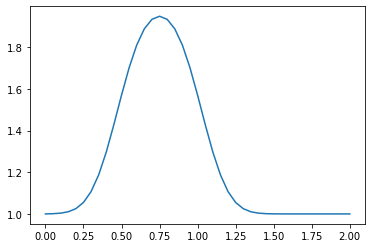

In [21]:
import numpy                 #loading our favorite library
from matplotlib import pyplot    #and the useful plotting library
%matplotlib inline

nx = 41
dx = 2 / (nx - 1)
nt = 20    #the number of timesteps we want to calculate
nu = 0.3   #the value of viscosity
sigma = .2 #sigma is a parameter, we'll learn more about it later
dt = sigma * dx**2 / nu #dt is defined using sigma ... more later!


u = numpy.ones(nx)      #a numpy array with nx elements all equal to 1.
u[int(.5 / dx):int(1 / dx + 1)] = 2  #setting u = 2 between 0.5 and 1 as per our I.C.s

un = numpy.ones(nx) #our placeholder array, un, to advance the solution in time

for n in range(nt):  #iterate through time
    un = u.copy() ##copy the existing values of u into un
    for i in range(1, nx - 1):
        u[i] = un[i] + nu * dt / dx**2 * (un[i+1] - 2 * un[i] + un[i-1])
        
pyplot.plot(numpy.linspace(0, 2, nx), u);

## 4. Burger's Equation

Burgers' equation in one spatial dimension looks like this:

$$\frac{\partial u}{\partial t} + u \frac{\partial u}{\partial x} = \nu \frac{\partial^{2} u}{\partial x^{2}}$$


As you can see, it is a combination of non-linear convection and diffusion. It is surprising how much you learn from this neat little equation!

We can discretize it using the methods we've used above. Using forward difference for time, backward difference for space and our 2nd-order method for the second derivatives yields:

$$\frac{u^{n+1}_{i}- u^{n}_{i}}{\Delta t} +u^{n}_{i} \frac{u^{n}_{i}- u^{n}_{i-1}}{\Delta x} = \nu \frac{u^{n}_{i+1}- 2u^{n}_{i} + u^{n}_{i-1}}{\Delta x^{2}}$$

As before, once we have an initial condition, the only unknown is $u^{n+1}-{i}$. We will step in time as follows:

$$u^{n+1}_{i} =u^{n}_{i} - u^{n}_{i}\frac{\Delta t}{\Delta x} (u^{n}_{i}- u^{n}_{i-1}) + \nu \frac{\Delta t}{\Delta x^{2}} (u^{n}_{i+1}- 2u^{n}_{i} + u^{n}_{i-1})$$

## Initial and Boundary Conditions

To examine some interesting properties of Burgers' equation, it is helpful to use different initial and boundary conditions than we've been using for previous steps.

Our initial condition for this problem is going to be:

$$ u = - \frac{2 \nu}{\phi} \frac{\partial \phi}{\partial x} + 4
$$

$$\phi = exp(\frac{-x^{2}}{4\nu}) + exp(\frac{-(x-2\pi)^{2}}{4\nu})$$

This has an analytical solution, given by:
    
 $$ u = - \frac{2 \nu}{\phi} \frac{\partial \phi}{\partial x} + 4$$
 
 $$\phi = exp(\frac{-(x-4 t)^{2}}{4\nu(t +1)}) + exp(\frac{-(x-4t-2\pi)^{2}}{4\nu(t +1)})$$

Our boundary condition will be:  
    $$ u(0) = u(2\pi) $$

This is called a periodic boundary condition. Pay attention! This will cause you a bit of headache if you don't tread carefully.

# Saving Time with SymPy

The initial condition we're using for Burgers' Equation can be a bit of a pain to evaluate by hand. The derivative $\frac{\partial \phi}{\partial x}$ isn't too terribly difficult, but it would be easy to drop a sign or forget a factor of $x$ somewhere, so we're going to use SymPy to help us out.

SymPy is the symbolic math library for Python. It has a lot of the same symbolic math functionality as Mathematica with the added benefit that we can easily translate its results back into our Python calculations (it is also free and open source).

Start by loading the SymPy library, together with our favorite library, NumPy.

In [22]:
import numpy
import sympy

In [23]:
from sympy import init_printing
init_printing(use_latex=True)

In [24]:
x, nu, t = sympy.symbols('x nu t')
phi = (sympy.exp(-(x - 4 * t)**2 / (4 * nu * (t + 1))) +
       sympy.exp(-(x - 4 * t - 2 * sympy.pi)**2 / (4 * nu * (t + 1))))
phi


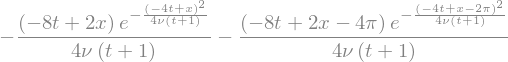

In [25]:
phiprime = phi.diff(x)
phiprime

In [26]:
print(phiprime)

-(-8*t + 2*x)*exp(-(-4*t + x)**2/(4*nu*(t + 1)))/(4*nu*(t + 1)) - (-8*t + 2*x - 4*pi)*exp(-(-4*t + x - 2*pi)**2/(4*nu*(t + 1)))/(4*nu*(t + 1))


Now what?
Now that we have the Pythonic version of our derivative, we can finish writing out the full initial condition equation and then translate it into a usable Python expression. For this, we'll use the lambdify function, which takes a SymPy symbolic equation and turns it into a callable function.

In [27]:
from sympy.utilities.lambdify import lambdify

u = -2 * nu * (phiprime / phi) + 4
print(u)

-2*nu*(-(-8*t + 2*x)*exp(-(-4*t + x)**2/(4*nu*(t + 1)))/(4*nu*(t + 1)) - (-8*t + 2*x - 4*pi)*exp(-(-4*t + x - 2*pi)**2/(4*nu*(t + 1)))/(4*nu*(t + 1)))/(exp(-(-4*t + x - 2*pi)**2/(4*nu*(t + 1))) + exp(-(-4*t + x)**2/(4*nu*(t + 1)))) + 4


To lambdify this expression into a useable function, we tell lambdify which variables to request and the function we want to plug them in to.

In [28]:
ufunc = lambdify((t, x, nu), u)
print(ufunc(1, 4, 3))


3.49170664206445


Back to Burgers' Equation
Now that we have the initial conditions set up, we can proceed and finish setting up the problem. We can generate the plot of the initial condition using our lambdify-ed function.

In [29]:
from matplotlib import pyplot
%matplotlib inline

###variable declarations
nx = 101
nt = 100
dx = 2 * numpy.pi / (nx - 1)
nu = .07
dt = dx * nu

x = numpy.linspace(0, 2 * numpy.pi, nx)
un = numpy.empty(nx)
t = 0

u = numpy.asarray([ufunc(t, x0, nu) for x0 in x])
u

array([4.        , 4.06283185, 4.12566371, 4.18849556, 4.25132741,
       4.31415927, 4.37699112, 4.43982297, 4.50265482, 4.56548668,
       4.62831853, 4.69115038, 4.75398224, 4.81681409, 4.87964594,
       4.9424778 , 5.00530965, 5.0681415 , 5.13097336, 5.19380521,
       5.25663706, 5.31946891, 5.38230077, 5.44513262, 5.50796447,
       5.57079633, 5.63362818, 5.69646003, 5.75929189, 5.82212374,
       5.88495559, 5.94778745, 6.0106193 , 6.07345115, 6.136283  ,
       6.19911486, 6.26194671, 6.32477856, 6.38761042, 6.45044227,
       6.51327412, 6.57610598, 6.63893783, 6.70176967, 6.76460125,
       6.82742866, 6.89018589, 6.95176632, 6.99367964, 6.72527549,
       4.        , 1.27472451, 1.00632036, 1.04823368, 1.10981411,
       1.17257134, 1.23539875, 1.29823033, 1.36106217, 1.42389402,
       1.48672588, 1.54955773, 1.61238958, 1.67522144, 1.73805329,
       1.80088514, 1.863717  , 1.92654885, 1.9893807 , 2.05221255,
       2.11504441, 2.17787626, 2.24070811, 2.30353997, 2.36637

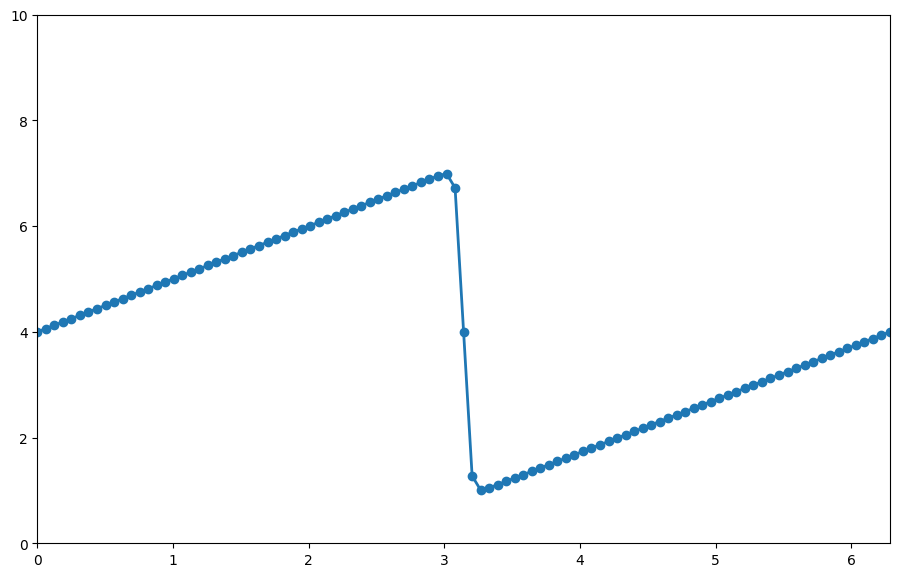

In [30]:
pyplot.figure(figsize=(11, 7), dpi=100)
pyplot.plot(x, u, marker='o', lw=2)
pyplot.xlim([0, 2 * numpy.pi])
pyplot.ylim([0, 10]);


In [31]:
for n in range(nt):
    un = u.copy()
    for i in range(1, nx-1):
        u[i] = un[i] - un[i] * dt / dx *(un[i] - un[i-1]) + nu * dt / dx**2 *\
                (un[i+1] - 2 * un[i] + un[i-1])
    u[0] = un[0] - un[0] * dt / dx * (un[0] - un[-2]) + nu * dt / dx**2 *\
                (un[1] - 2 * un[0] + un[-2])
    u[-1] = u[0]
        
u_analytical = numpy.asarray([ufunc(nt * dt, xi, nu) for xi in x])

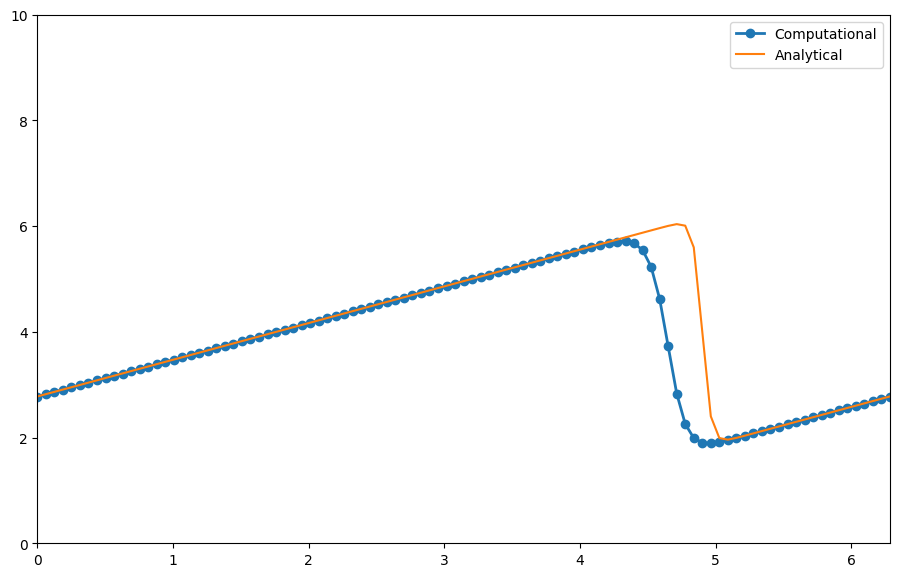

In [32]:
pyplot.figure(figsize=(11, 7), dpi=100)
pyplot.plot(x,u, marker='o', lw=2, label='Computational')
pyplot.plot(x, u_analytical, label='Analytical')
pyplot.xlim([0, 2 * numpy.pi])
pyplot.ylim([0, 10])
pyplot.legend();

What next?
The subsequent steps, from 5 to 12, will be in two dimensions. But it is easy to extend the 1D finite-difference formulas to the partial derivatives in 2D or 3D. Just apply the definition — a partial derivative with respect to x is the variation in the x direction while keeping y constant.

Before moving on to Step 5, make sure you have completed your own code for steps 1 through 4 and you have experimented with the parameters and thought about what is happening. Also, we recommend that you take a slight break to learn about array operations with NumPy.

## Array Operations with NumPy

For more computationally intensive programs, the use of built-in Numpy functions can provide an increase in execution speed many-times over. As a simple example, consider the following equation:

$$u^{n+1}_{i}=u^{n}_{i}−u^{n}_{i−1}$$
Now, given a vector $u^{n}=[0,1,2,3,4,5]$   we can calculate the values of $u^{n+1}$ by iterating over the values of $u^{n}$ with a for loop.

In [33]:
import numpy

In [34]:
u = numpy.array((0, 1, 2, 3, 4, 5))

for i in range(1, len(u)):
    print(u[i] - u[i-1])


1
1
1
1
1


This is the expected result and the execution time was nearly instantaneous. If we perform the same operation as an array operation, then rather than calculate $u^{n}_{i}−u^{n}_{i−1}$  5 separate times, we can slice the u array and calculate each operation with one command:

In [35]:
u[1:] - u[0:-1]

array([1, 1, 1, 1, 1])

What this command says is subtract the 0th, 1st, 2nd, 3rd, 4th and 5th elements of u from the 1st, 2nd, 3rd, 4th, 5th and 6th elements of u.

Speed Increases
For a 6 element array, the benefits of array operations are pretty slim. There will be no appreciable difference in execution time because there are so few operations taking place. But if we revisit 2D linear convection, we can see some substantial speed increases.

## Speed Increases

For a 6 element array, the benefits of array operations are pretty slim. There will be no appreciable difference in execution time because there are so few operations taking place. But if we revisit 2D linear convection, we can see some substantial speed increases.

In [37]:
nx = 81
ny = 81
nt = 100
c = 1
dx = 2 / (nx - 1)
dy = 2 / (ny - 1)
sigma = .2
dt = sigma * dx

x = numpy.linspace(0, 2, nx)
y = numpy.linspace(0, 2, ny)

u = numpy.ones((ny, nx)) ##create a 1xn vector of 1's
un = numpy.ones((ny, nx)) 

###Assign initial conditions

u[int(.5 / dy): int(1 / dy + 1), int(.5 / dx):int(1 / dx + 1)] = 2

With our initial conditions all set up, let's first try running our original nested loop code, making use of the iPython "magic" function %%timeit, which will help us evaluate the performance of our code.

Note: The %%timeit magic function will run the code several times and then give an average execution time as a result. If you have any figures being plotted within a cell where you run %%timeit, it will plot those figures repeatedly which can be a bit messy.

The execution times below will vary from machine to machine. Don't expect your times to match these times, but you should expect to see the same general trend in decreasing execution time as we switch to array operations.

In [38]:
%%timeit
u = numpy.ones((ny, nx))
u[int(.5 / dy): int(1 / dy + 1), int(.5 / dx):int(1 / dx + 1)] = 2

for n in range(nt + 1): ##loop across number of time steps
    un = u.copy()
    row, col = u.shape
    for j in range(1, row):
        for i in range(1, col):
            u[j, i] = (un[j, i] - (c * dt / dx * 
                                  (un[j, i] - un[j, i - 1])) - 
                                  (c * dt / dy * 
                                   (un[j, i] - un[j - 1, i])))
            u[0, :] = 1
            u[-1, :] = 1
            u[:, 0] = 1
            u[:, -1] = 1


15.2 s ± 120 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


With the "raw" Python code above, the mean execution time achieved was 14.0 seconds (on a Lenovo ideapad 300). Keep in mind that with these three nested loops, that the statements inside the j loop are being evaluated more than 650,000 times. Let's compare that with the performance of the same code implemented with array operations:



In [39]:
%%timeit
u = numpy.ones((ny, nx))
u[int(.5 / dy): int(1 / dy + 1), int(.5 / dx):int(1 / dx + 1)] = 2

for n in range(nt + 1): ##loop across number of time steps
    un = u.copy()
    u[1:, 1:] = (un[1:, 1:] - (c * dt / dx * (un[1:, 1:] - un[1:, 0:-1])) -
                              (c * dt / dy * (un[1:, 1:] - un[0:-1, 1:])))
    u[0, :] = 1
    u[-1, :] = 1
    u[:, 0] = 1
    u[:, -1] = 1

20.9 ms ± 163 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


As you can see, the speed increase is substantial. The same calculation goes from 3.07 seconds to 7.38 milliseconds. 3 seconds isn't a huge amount of time to wait, but these speed gains will increase exponentially with the size and complexity of the problem being evaluated.



## 5. 2-D Linear Convection

We extend the first four steps to 2D. To extend the 1D finite-difference formulas to partial derivatives in 2D or 3D, just apply the definition: a partial derivative with respect to $x$ is the variation in the $x$ direction at constant $y$.

In 2D space, a rectangular (uniform) grid is defined by the points with coordinates:
$$x_{i}=x_{0}+i\Delta x$$
$$y_{i}=y_{0}+i\Delta y$$

Now, define $u_{i,j}=u(x_{i},y_{j})$ and apply the finite-difference formulas on either variable $x,y$ acting separately on the $i$ and $j$ indices. All derivatives are based on the 2D Taylor expansion of a mesh point value around $u_{i,j}$.

Hence, for a first-order partial derivative in the $x$-direction, a finite-difference formula is:

$$ \frac{\partial u}{\partial x}|_{i,j} = \frac{u_{i+1,j} − u_{i,j}}{\Delta x}  + O(\Delta x) $$
and similarly in the $y$ direction. Thus, we can write backward-difference, forward-difference or central-difference formulas for Steps 5 to 12. Let's get started!



The PDE governing 2-D Linear Convection is written as
$$ \frac{\partial u}{\partial t} + c \frac{\partial u}{\partial x} +c \frac{\partial u}{\partial y}= 0$$
This is the exact same form as with 1-D Linear Convection, except that we now have two spatial dimensions to account for as we step forward in time.

Again, the timestep will be discretized as a forward difference and both spatial steps will be discretized as backward differences.

With 1-D implementations, we used $i$ subscripts to denote movement in space (e.g. $u^{n}_{i}−u^{n}_{i−1}$). Now that we have two dimensions to account for, we need to add a second subscript, j, to account for all the information in the regime.

Here, we'll again use $i$ as the index for our $x$ values, and we'll add the $j$ subscript to track our $y$ values.

$$\frac{u^{n+1}_{i,j}- u^{n}_{i,j}}{\Delta t} +c \frac{u^{n}_{i,j}- u^{n}_{i-1,j}}{\Delta x} +c \frac{u^{n}_{i,j}- u^{n}_{i, j-1}}{\Delta y} = 0 $$

As before, solve for the only unknown:

$$u^{n+1}_{i,j} =  u^{n}_{i} - c\frac{\Delta t}{\Delta x} (u^{n}_{i,j}- u^{n}_{i-1,j}) - c\frac{\Delta t}{\Delta y} (u^{n}_{i,j}- u^{n}_{i,j-1}) $$

We will solve this equation with the following initial conditions:

$$ u(x,y) =
   \begin{cases} 
      2 & 0.5 \leq x,y \leq 1 \\
        1 & \text{everywhere else}
   \end{cases}
$$

and boundary conditions:


$$ u(x,y) = 1 \text{for}
   \begin{cases} 
        x = 0,2 \\
        y = 0,2
   \end{cases}
$$

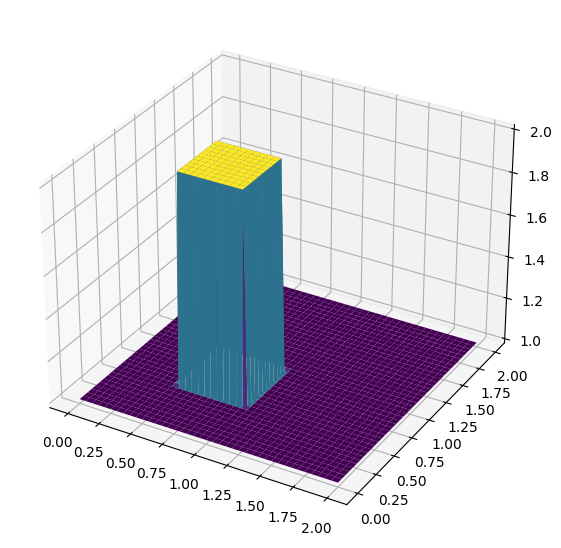

In [48]:
from mpl_toolkits.mplot3d import Axes3D    ##New Library required for projected 3d plots

import numpy
from matplotlib import pyplot, cm
%matplotlib inline

###variable declarations
nx = 81
ny = 81
nt = 250
c = 1
dx = 2 / (nx - 1)
dy = 2 / (ny - 1)
sigma = .2
dt = sigma * dx

x = numpy.linspace(0, 2, nx)
y = numpy.linspace(0, 2, ny)

u = numpy.ones((ny, nx)) ##create a 1xn vector of 1's
un = numpy.ones((ny, nx)) ##

###Assign initial conditions

##set hat function I.C. : u(.5<=x<=1 && .5<=y<=1 ) is 2
u[int(.5 / dy):int(1 / dy + 1),int(.5 / dx):int(1 / dx + 1)] = 2 

###Plot Initial Condition
##the figsize parameter can be used to produce different sized images
fig = pyplot.figure(figsize=(11, 7), dpi=100)
ax = fig.gca(projection='3d')                      
X, Y = numpy.meshgrid(x, y)     
surf = ax.plot_surface(X, Y, u[:], cmap=cm.viridis)

## Iterating in two dimensions

To evaluate the wave in two dimensions requires the use of several nested for-loops to cover all of the $i's$ and $j's$. Since Python is not a compiled language there can be noticeable slowdowns in the execution of code with multiple for-loops. First try evaluating the 2D convection code and see what results it produces.

37 s ± 113 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


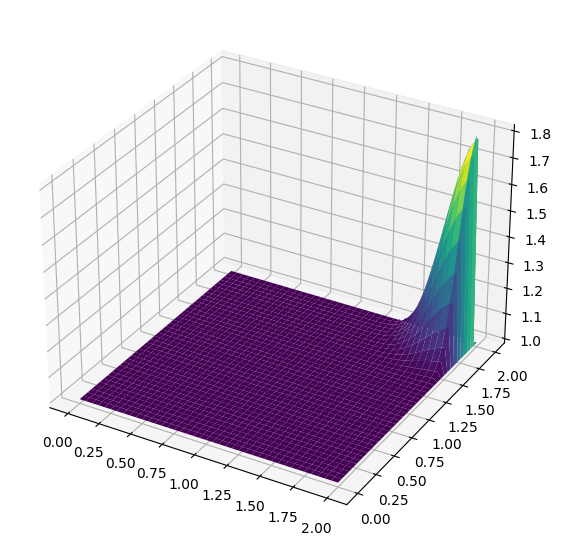

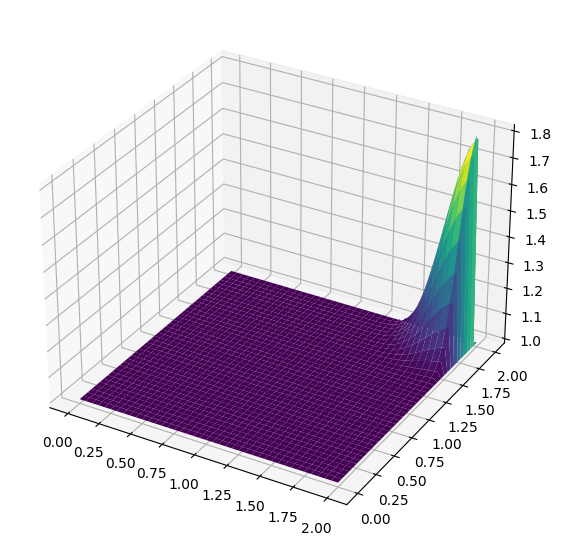

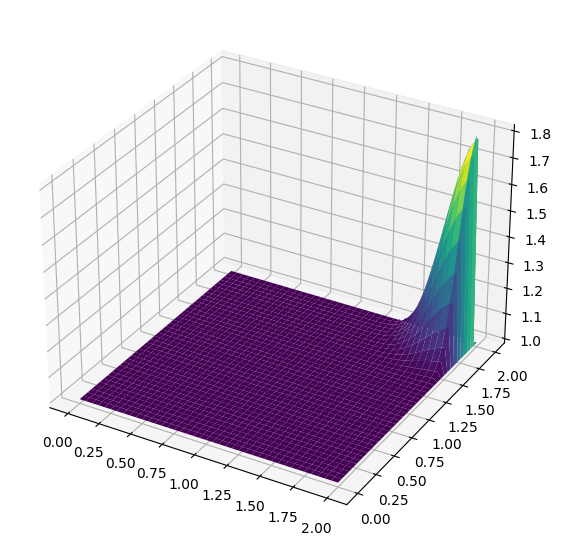

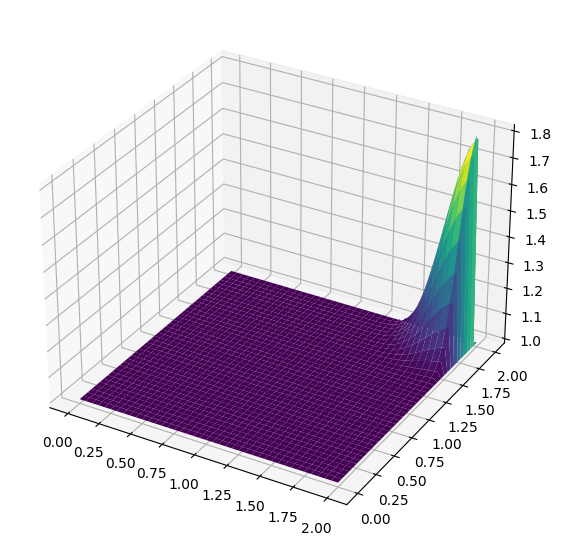

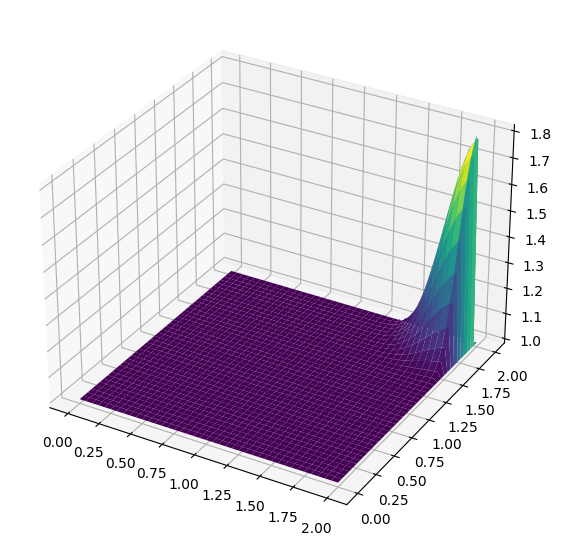

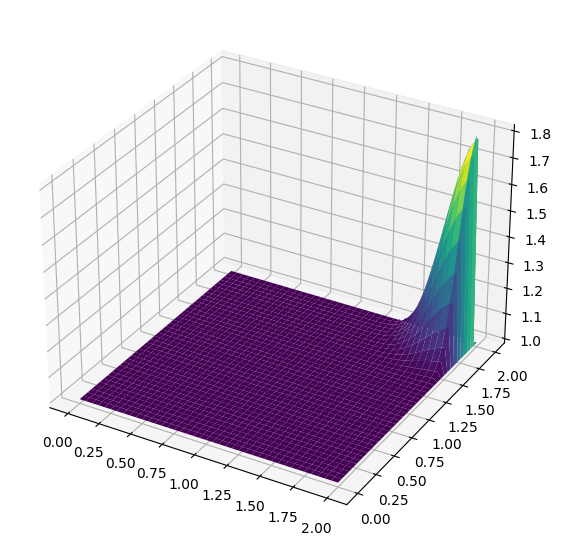

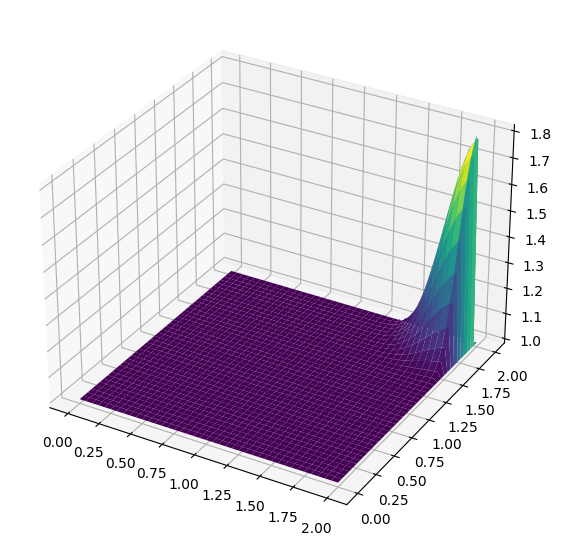

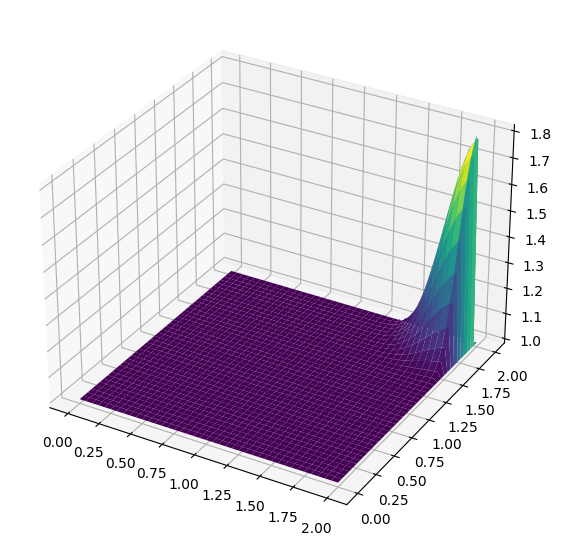

In [49]:
%%timeit
u = numpy.ones((ny, nx))
u[int(.5 / dy):int(1 / dy + 1), int(.5 / dx):int(1 / dx + 1)] = 2

for n in range(nt + 1): ##loop across number of time steps
    un = u.copy()
    row, col = u.shape
    for j in range(1, row):
        for i in range(1, col):
            u[j, i] = (un[j, i] - (c * dt / dx * (un[j, i] - un[j, i - 1])) -
                                  (c * dt / dy * (un[j, i] - un[j - 1, i])))
            u[0, :] = 1
            u[-1, :] = 1
            u[:, 0] = 1
            u[:, -1] = 1

# Make plots
fig = pyplot.figure(figsize=(11, 7), dpi=100)
ax = fig.gca(projection='3d')
surf2 = ax.plot_surface(X, Y, u[:], cmap=cm.viridis)

Array Operations
Here the same 2D convection code is implemented, but instead of using nested for-loops, the same calculations are evaluated using array operations.

/home/johnson/.local/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


140 ms ± 6.22 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


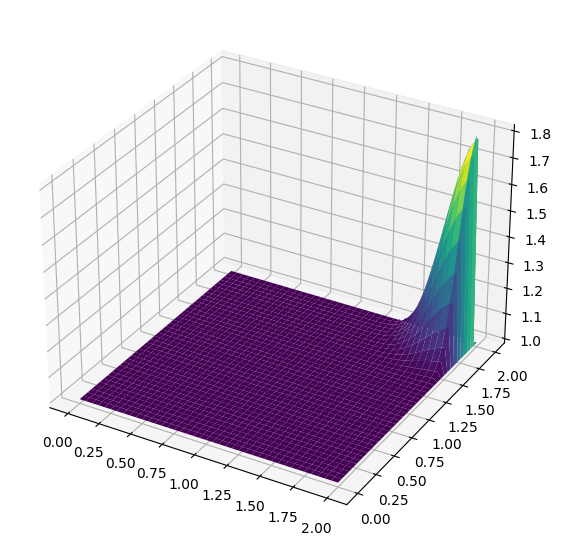

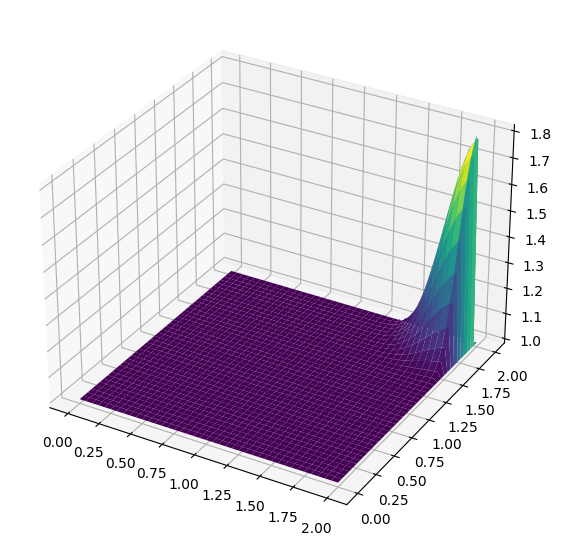

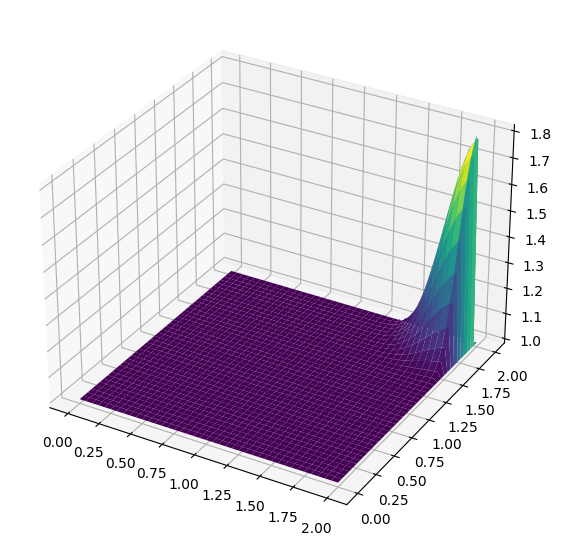

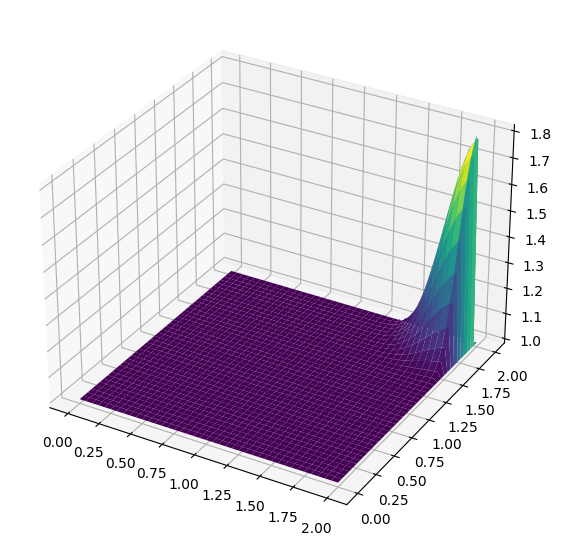

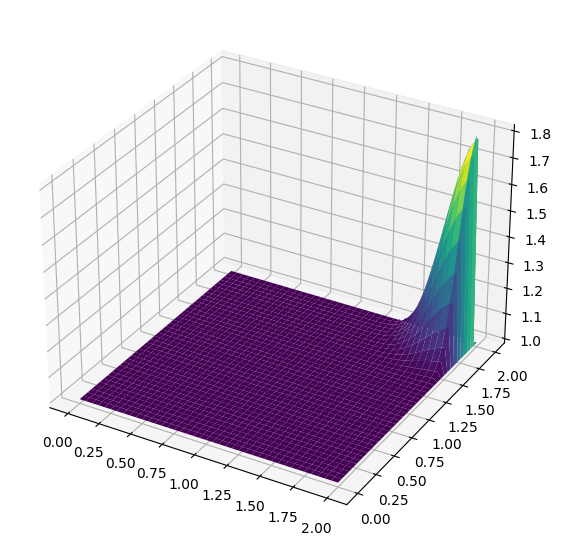

...

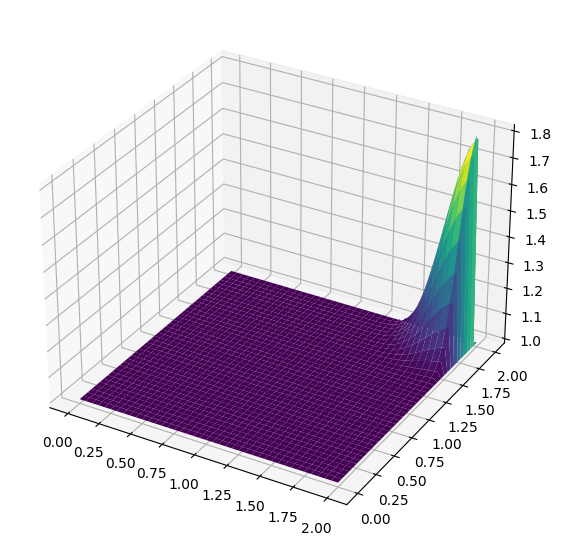

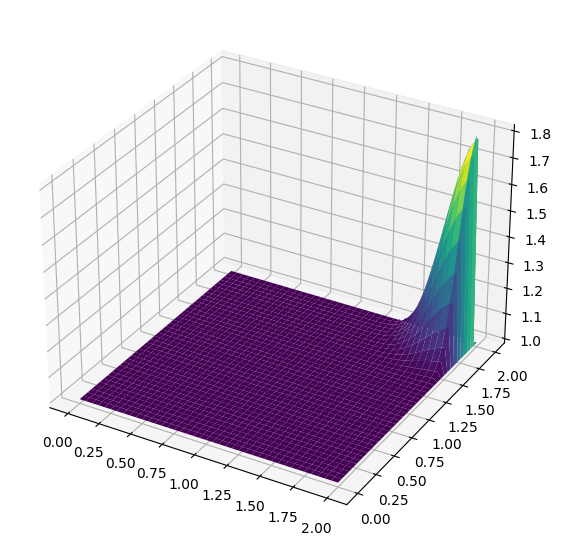

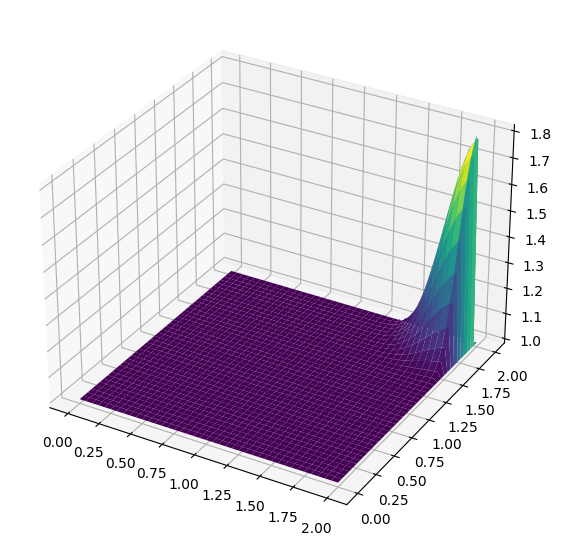

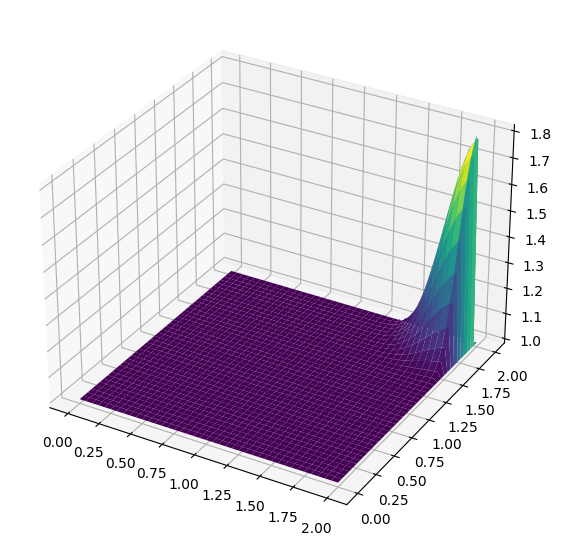

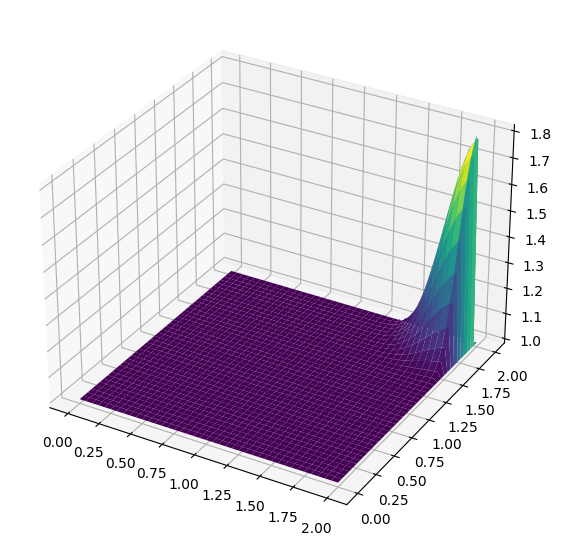

In [52]:
%%timeit

u = numpy.ones((ny, nx))
u[int(.5 / dy):int(1 / dy + 1), int(.5 / dx):int(1 / dx + 1)] = 2

for n in range(nt + 1): ##loop across number of time steps
    un = u.copy()
    u[1:, 1:] = (un[1:, 1:] - (c * dt / dx * (un[1:, 1:] - un[1:, :-1])) -
                              (c * dt / dy * (un[1:, 1:] - un[:-1, 1:])))
    u[0, :] = 1
    u[-1, :] = 1
    u[:, 0] = 1
    u[:, -1] = 1

## Make plots

fig = pyplot.figure(figsize=(11, 7), dpi=100)
ax = fig.gca(projection='3d')
surf2 = ax.plot_surface(X, Y, u[:], cmap=cm.viridis)

## 6.  2-D Convection

Now we solve 2D Convection, represented by the pair of coupled partial differential equations below:

$$ \frac{\partial u}{\partial t} + u \frac{\partial u}{\partial x} +v \frac{\partial u}{\partial y}= 0$$

$$ \frac{\partial v}{\partial t} + u \frac{\partial v}{\partial x} +v \frac{\partial v}{\partial y}= 0$$


Discretizing these equations using the methods we've applied previously yields:

$$\frac{u^{n+1}_{i,j}- u^{n}_{i,j}}{\Delta t} + u^{n}_{i,j} \frac{u^{n}_{i,j}- u^{n}_{i-1,j}}{\Delta x} + v^{n}_{i,j} \frac{u^{n}_{i,j}- u^{n}_{i, j-1}}{\Delta y} = 0 $$

$$\frac{v^{n+1}_{i,j}- v^{n}_{i,j}}{\Delta t} + u^{n}_{i,j} \frac{v^{n}_{i,j}- v^{n}_{i-1,j}}{\Delta x} + v^{n}_{i,j} \frac{v^{n}_{i,j}- v^{n}_{i, j-1}}{\Delta y} = 0 $$

As before, solve for the only unknown:

$$u^{n+1}_{i,j} =  u^{n}_{i,j} -  u^{n}_{i,j}\frac{\Delta t}{\Delta x} (u^{n}_{i,j}- u^{n}_{i-1,j}) -  v^{n}_{i,j}\frac{\Delta t}{\Delta y} (u^{n}_{i,j}- u^{n}_{i,j-1}) $$


$$v^{n+1}_{i,j} =  v^{n}_{i,j} -  u^{n}_{i,j}\frac{\Delta t}{\Delta x} (v^{n}_{i,j}- v^{n}_{i-1,j}) -  v^{n}_{i,j}\frac{\Delta t}{\Delta y} (v^{n}_{i,j}- v^{n}_{i,j-1}) $$

## Initial Conditions

We will solve this equation with the following initial conditions:

$$ u(x,y) =
   \begin{cases} 
      2 & \text{ for x, y $\epsilon$ (0.5, 1) $\times$ (0.5, 1)}\\
        1 & \text{everywhere else}
   \end{cases}
$$

## Boundary Conditions

The boundary conditions hold u and v equal to 1 along the boundaries of the grid .


$$ u = 1, v =1 \text{for}
   \begin{cases} 
        x = 0,2 \\
        y = 0,2
   \end{cases}
$$


In [61]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import pyplot, cm
import numpy
%matplotlib inline


In [62]:
###variable declarations
nx = 101
ny = 101
nt = 200
c = 1
dx = 2 / (nx - 1)
dy = 2 / (ny - 1)
sigma = .2
dt = sigma * dx

x = numpy.linspace(0, 2, nx)
y = numpy.linspace(0, 2, ny)

u = numpy.ones((ny, nx)) ##create a 1xn vector of 1's
v = numpy.ones((ny, nx))
un = numpy.ones((ny, nx))
vn = numpy.ones((ny, nx))

###Assign initial conditions
##set hat function I.C. : u(.5<=x<=1 && .5<=y<=1 ) is 2
u[int(.5 / dy):int(1 / dy + 1), int(.5 / dx):int(1 / dx + 1)] = 2
##set hat function I.C. : v(.5<=x<=1 && .5<=y<=1 ) is 2
v[int(.5 / dy):int(1 / dy + 1), int(.5 / dx):int(1 / dx + 1)] = 2

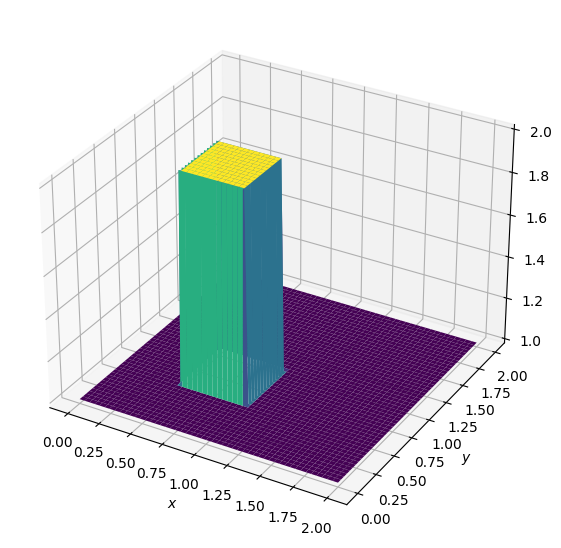

In [63]:
fig = pyplot.figure(figsize=(11, 7), dpi=100)
ax = fig.gca(projection='3d')
X, Y = numpy.meshgrid(x, y)

ax.plot_surface(X, Y, u, cmap=cm.viridis, rstride=2, cstride=2)
ax.set_xlabel('$x$')
ax.set_ylabel('$y$');


In [64]:
for n in range(nt + 1): ##loop across number of time steps
    un = u.copy()
    vn = v.copy()
    u[1:, 1:] = (un[1:, 1:] - 
                 (un[1:, 1:] * c * dt / dx * (un[1:, 1:] - un[1:, :-1])) -
                  vn[1:, 1:] * c * dt / dy * (un[1:, 1:] - un[:-1, 1:]))
    v[1:, 1:] = (vn[1:, 1:] -
                 (un[1:, 1:] * c * dt / dx * (vn[1:, 1:] - vn[1:, :-1])) -
                 vn[1:, 1:] * c * dt / dy * (vn[1:, 1:] - vn[:-1, 1:]))
    
    u[0, :] = 1
    u[-1, :] = 1
    u[:, 0] = 1
    u[:, -1] = 1
    
    v[0, :] = 1
    v[-1, :] = 1
    v[:, 0] = 1
    v[:, -1] = 1

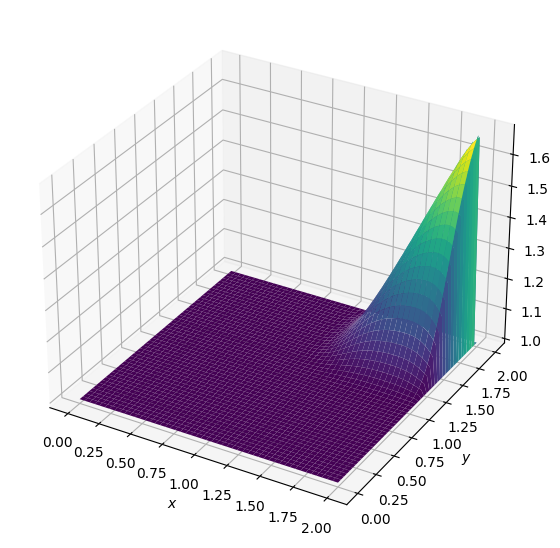

In [65]:
fig = pyplot.figure(figsize=(11, 7), dpi=100)
ax = fig.gca(projection='3d')
X, Y = numpy.meshgrid(x, y)

ax.plot_surface(X, Y, u, cmap=cm.viridis, rstride=2, cstride=2)
ax.set_xlabel('$x$')
ax.set_ylabel('$y$');


## 7. 2D Diffusion¶


And here is the 2D-diffusion equation:

$$\frac{\partial u}{\partial t} = \nu \frac{\partial^{2} u}{\partial x^{2}} + \nu \frac{\partial^{2} u}{\partial y^{2}}$$


You will recall that we came up with a method for discretizing second order derivatives in Step 3, when investigating 1-D diffusion. We are going to use the same scheme here, with our forward difference in time and two second-order derivatives.

$$\frac{u^{n+1}_{i}- u^{n}_{i}}{\Delta t} = \nu \frac{u^{n}_{i+1}- 2u^{n}_{i} + u^{n}_{i-1}}{\Delta x^{2}}+ \nu \frac{u^{n}_{i+1}- 2u^{n}_{i} + u^{n}_{i-1}}{\Delta y^{2}}$$

Once again, we reorganize the discretized equation and solve for $u^{n+1}_{i,j}$

$$u^{n+1}_{i} = u^{n}_{i} + \nu \frac{\Delta t}{\Delta x^{2}} (u^{n}_{i+1}- 2u^{n}_{i} + u^{n}_{i-1}) + \nu \frac{\Delta t}{\Delta y^{2}} (u^{n}_{i+1}- 2u^{n}_{i} + u^{n}_{i-1})$$


In [66]:
import numpy
from matplotlib import pyplot, cm
from mpl_toolkits.mplot3d import Axes3D ##library for 3d projection plots
%matplotlib inline


In [67]:
###variable declarations
nx = 31
ny = 31
nt = 17
nu = .05
dx = 2 / (nx - 1)
dy = 2 / (ny - 1)
sigma = .25
dt = sigma * dx * dy / nu

x = numpy.linspace(0, 2, nx)
y = numpy.linspace(0, 2, ny)

u = numpy.ones((ny, nx))  # create a 1xn vector of 1's
un = numpy.ones((ny, nx))

###Assign initial conditions
# set hat function I.C. : u(.5<=x<=1 && .5<=y<=1 ) is 2
u[int(.5 / dy):int(1 / dy + 1),int(.5 / dx):int(1 / dx + 1)] = 2  

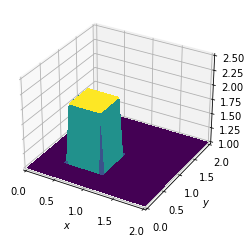

In [68]:
fig = pyplot.figure()
ax = fig.gca(projection='3d')
X, Y = numpy.meshgrid(x, y)
surf = ax.plot_surface(X, Y, u, rstride=1, cstride=1, cmap=cm.viridis,
        linewidth=0, antialiased=False)

ax.set_xlim(0, 2)
ax.set_ylim(0, 2)
ax.set_zlim(1, 2.5)

ax.set_xlabel('$x$')
ax.set_ylabel('$y$');

In [69]:
###Run through nt timesteps
def diffuse(nt):
    u[int(.5 / dy):int(1 / dy + 1),int(.5 / dx):int(1 / dx + 1)] = 2  
    
    for n in range(nt + 1): 
        un = u.copy()
        u[1:-1, 1:-1] = (un[1:-1,1:-1] + 
                        nu * dt / dx**2 * 
                        (un[1:-1, 2:] - 2 * un[1:-1, 1:-1] + un[1:-1, 0:-2]) +
                        nu * dt / dy**2 * 
                        (un[2:,1: -1] - 2 * un[1:-1, 1:-1] + un[0:-2, 1:-1]))
        u[0, :] = 1
        u[-1, :] = 1
        u[:, 0] = 1
        u[:, -1] = 1

    
    fig = pyplot.figure(figsize =(10,10))
    ax = fig.gca(projection='3d')
    surf = ax.plot_surface(X, Y, u[:], rstride=1, cstride=1, cmap=cm.viridis,
        linewidth=0, antialiased=True)
    ax.set_zlim(1, 2.5)
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$');
    

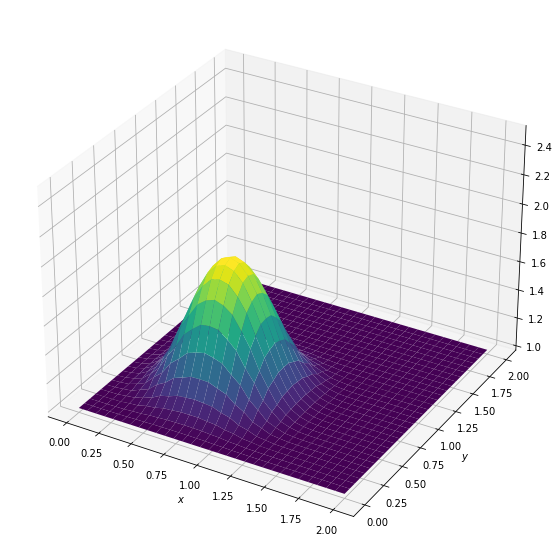

In [70]:
diffuse(10)

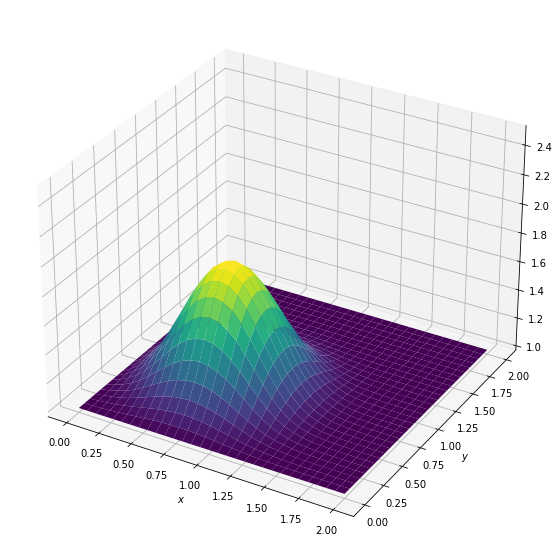

In [71]:
diffuse(14)

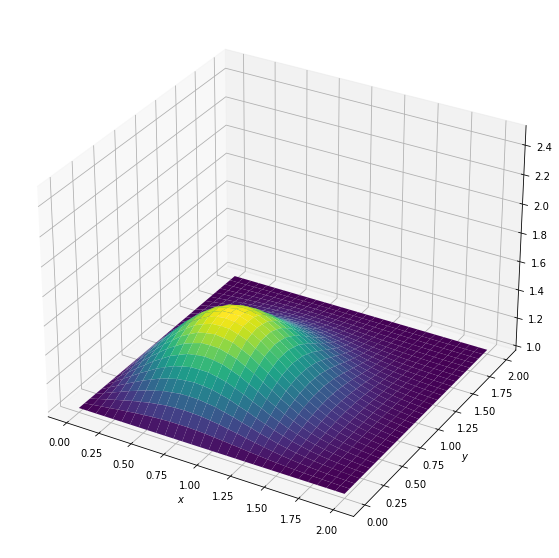

In [72]:
diffuse(50)

## 8. Burgers' Equation in 2D

Remember, Burgers' equation can generate discontinuous solutions from an initial condition that is smooth, i.e., can develop "shocks." We want to see this in two dimensions now!


$$\frac{\partial u}{\partial t} + u \frac{\partial u}{\partial x} + v \frac{\partial u}{\partial y} = \nu (\frac{\partial^{2} u}{\partial x^{2}} + \frac{\partial^{2} u}{\partial y^{2}})$$


$$\frac{\partial v}{\partial t} + u \frac{\partial v}{\partial x} + v \frac{\partial v}{\partial y} = \nu (\frac{\partial^{2} v}{\partial x^{2}} + \frac{\partial^{2} v}{\partial y^{2}})$$



We know how to discretize each term: we've already done it before!

$$\frac{u^{n+1}_{i,j}- u^{n}_{i,j}}{\Delta t} +u^{n}_{i,j} \frac{u^{n}_{i,j}- u^{n}_{i-1,j}}{\Delta x} + v^{n}_{i,j} \frac{u^{n}_{i,j}- u^{n}_{i,j-1}}{\Delta y} = \nu (\frac{u^{n}_{i+1,j}- 2u^{n}_{i,j} + u^{n}_{i-1,j}}{\Delta x^{2}} + \frac{u^{n}_{i,j+1}- 2u^{n}_{i,j} + u^{n}_{i,j-1}}{\Delta y^{2}})$$

$$\frac{v^{n+1}_{i,j}- v^{n}_{i,j}}{\Delta t} +u^{n}_{i,j} \frac{v^{n}_{i,j}- v^{n}_{i-1,j}}{\Delta x} + v^{n}_{i,j} \frac{v^{n}_{i,j}- v^{n}_{i,j-1}}{\Delta y} = \nu (\frac{v^{n}_{i+1,j}- 2v^{n}_{i,j} + v^{n}_{i-1,j}}{\Delta x^{2}} + \frac{v^{n}_{i,j+1}- 2v^{n}_{i,j} + v^{n}_{i,j-1}}{\Delta y^{2}})$$

And now, we will rearrange each of these equations for the only unknown: the two components $u$,$v$ of the solution at the next time step:

$$u^{n+1}_{i,j} =u^{n}_{i,j} - u^{n}_{i,j}\frac{\Delta t}{\Delta x} (u^{n}_{i,j}- u^{n}_{i-1,j}) - v^{n}_{i,j}\frac{\Delta t}{\Delta y} (u^{n}_{i,j}- u^{n}_{i,j-1}) + \nu \frac{\Delta t}{\Delta x^{2}} (u^{n}_{i+1,j}- 2u^{n}_{i,j} + u^{n}_{i-1,j}) + \nu \frac{\Delta t}{\Delta y^{2}} (u^{n}_{i, j+1}- 2u^{n}_{i,j} + u^{n}_{i,j-1})$$

$$v^{n+1}_{i,j} = v^{n}_{i,j} - u^{n}_{i,j}\frac{\Delta t}{\Delta x} (v^{n}_{i,j}- v^{n}_{i-1,j}) - v^{n}_{i,j}\frac{\Delta t}{\Delta y} (v^{n}_{i,j}- v^{n}_{i,j-1}) + \nu \frac{\Delta t}{\Delta x^{2}} (v^{n}_{i+1,j}- 2v^{n}_{i,j} + v^{n}_{i-1,j}) + \nu \frac{\Delta t}{\Delta y^{2}} (v^{n}_{i, j+1}- 2v^{n}_{i,j} + v^{n}_{i,j-1})$$

In [73]:
import numpy
from matplotlib import pyplot, cm
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline


In [74]:
###variable declarations
nx = 41
ny = 41
nt = 120
c = 1
dx = 2 / (nx - 1)
dy = 2 / (ny - 1)
sigma = .0009
nu = 0.01
dt = sigma * dx * dy / nu


x = numpy.linspace(0, 2, nx)
y = numpy.linspace(0, 2, ny)

u = numpy.ones((ny, nx))  # create a 1xn vector of 1's
v = numpy.ones((ny, nx))
un = numpy.ones((ny, nx)) 
vn = numpy.ones((ny, nx))
comb = numpy.ones((ny, nx))

###Assign initial conditions

##set hat function I.C. : u(.5<=x<=1 && .5<=y<=1 ) is 2
u[int(.5 / dy):int(1 / dy + 1),int(.5 / dx):int(1 / dx + 1)] = 2 
##set hat function I.C. : u(.5<=x<=1 && .5<=y<=1 ) is 2
v[int(.5 / dy):int(1 / dy + 1),int(.5 / dx):int(1 / dx + 1)] = 2

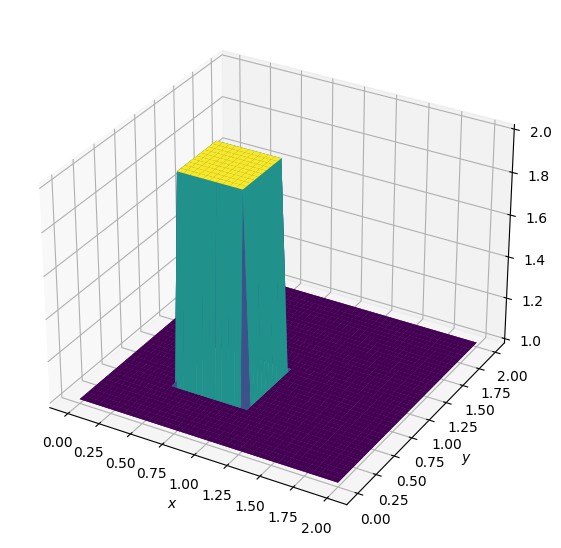

In [75]:
###(plot ICs)
fig = pyplot.figure(figsize=(11, 7), dpi=100)
ax = fig.gca(projection='3d')
X, Y = numpy.meshgrid(x, y)
ax.plot_surface(X, Y, u[:], cmap=cm.viridis, rstride=1, cstride=1)
ax.plot_surface(X, Y, v[:], cmap=cm.viridis, rstride=1, cstride=1)
ax.set_xlabel('$x$')
ax.set_ylabel('$y$');


In [76]:
for n in range(nt + 1): ##loop across number of time steps
    un = u.copy()
    vn = v.copy()

    u[1:-1, 1:-1] = (un[1:-1, 1:-1] -
                     dt / dx * un[1:-1, 1:-1] * 
                     (un[1:-1, 1:-1] - un[1:-1, 0:-2]) - 
                     dt / dy * vn[1:-1, 1:-1] * 
                     (un[1:-1, 1:-1] - un[0:-2, 1:-1]) + 
                     nu * dt / dx**2 * 
                     (un[1:-1,2:] - 2 * un[1:-1, 1:-1] + un[1:-1, 0:-2]) + 
                     nu * dt / dy**2 * 
                     (un[2:, 1:-1] - 2 * un[1:-1, 1:-1] + un[0:-2, 1:-1]))
    
    v[1:-1, 1:-1] = (vn[1:-1, 1:-1] - 
                     dt / dx * un[1:-1, 1:-1] *
                     (vn[1:-1, 1:-1] - vn[1:-1, 0:-2]) -
                     dt / dy * vn[1:-1, 1:-1] * 
                    (vn[1:-1, 1:-1] - vn[0:-2, 1:-1]) + 
                     nu * dt / dx**2 * 
                     (vn[1:-1, 2:] - 2 * vn[1:-1, 1:-1] + vn[1:-1, 0:-2]) +
                     nu * dt / dy**2 *
                     (vn[2:, 1:-1] - 2 * vn[1:-1, 1:-1] + vn[0:-2, 1:-1]))
     
    u[0, :] = 1
    u[-1, :] = 1
    u[:, 0] = 1
    u[:, -1] = 1
    
    v[0, :] = 1
    v[-1, :] = 1
    v[:, 0] = 1
    v[:, -1] = 1

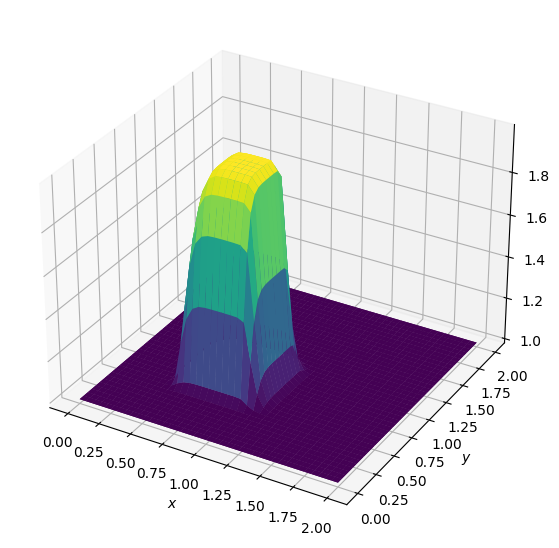

In [77]:
fig = pyplot.figure(figsize=(11, 7), dpi=100)
ax = fig.gca(projection='3d')
X, Y = numpy.meshgrid(x, y)
ax.plot_surface(X, Y, u, cmap=cm.viridis, rstride=1, cstride=1)
ax.plot_surface(X, Y, v, cmap=cm.viridis, rstride=1, cstride=1)
ax.set_xlabel('$x$')
ax.set_ylabel('$y$');


## 9. 2D Laplace Equation

Here is Laplace's equation in 2D:

$$ \frac{\partial^{2} p}{ \partial x^{2}} + \frac{\partial^{2} p}{ \partial y^{2}}=0$$


We know how to discretize a 2nd order derivative. But think about this for a minute — Laplace's equation has the features typical of diffusion phenomena. For this reason, it has to be discretized with central differences, so that the discretization is consistent with the physics we want to simulate.

The discretized equation is:
$$\frac{p^{n}_{i+1,j}- 2p^{n}_{i,j} + p^{n}_{i-1,j}}{\Delta x^{2}} + \frac{p^{n}_{i,j+1}- 2p^{n}_{i,j} + p^{n}_{i,j-1}}{\Delta y^{2}} =0$$

Notice that the Laplace Equation does not have a time dependence — there is no $p^{n+1}$. Instead of tracking a wave through time (like in the previous steps), the Laplace equation calculates the equilibrium state of a system under the supplied boundary conditions.



If you have taken coursework in Heat Transfer, you will recognize the Laplace Equation as the steady-state heat equation.

Instead of calculating where the system will be at some time $t$, we will iteratively solve for $p^{n}_{i,j}$ until it meets a condition that we specify. The system will reach equilibrium only as the number of iterations tends to $\infty$, but we can approximate the equilibrium state by iterating until the change between one iteration and the next is very small.


Let's rearrange the discretized equation, solving for $p^{n}_{i,j}$:

$$p^{n}_{i,j} = \frac{\Delta x^{2} (p^{n}_{i,j+1} + p^{n}_{i,j-1}) + \Delta y^{2} (p^{n}_{i+1,j} + p^{n}_{i-1,j})}{2(\Delta x^{2} + \Delta y^{2})}$$

Using second-order central-difference schemes in both directions is the most widely applied method for the Laplace operator. It is also known as the $\textbf{five-point difference operator}$, alluding to its stencil.

We are going to solve Laplace's equation numerically by assuming an initial state of $p=0$ everywhere. Then we add boundary conditions as follows:

$p=0$ at $x=0$
$p=y$ at $x=2$
$\frac{\partial p}{\partial y}$ at $y=0, 1$
Under these conditions, there is an analytical solution for Laplace's equation:

$$p(x,y)=\frac{x}{4}−4\sum_{n=1,odd}^{\infty}\frac{1}{(nπ)^{2}\sinh2n \pi}\sinh n\pi x \cos n\pi y$$

In [78]:
import numpy
from matplotlib import pyplot, cm
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

In [79]:
def plot2D(x, y, p):
    fig = pyplot.figure(figsize=(11, 7), dpi=100)
    ax = fig.gca(projection='3d')
    X, Y = numpy.meshgrid(x, y)
    surf = ax.plot_surface(X, Y, p[:], rstride=1, cstride=1, cmap=cm.viridis,
            linewidth=0, antialiased=False)
    ax.set_xlim(0, 2)
    ax.set_ylim(0, 1)
    ax.view_init(30, 225)
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')


The function plot2D takes three arguments, an x-vector, a y-vector and our p matrix. Given these three values, it produces a 3D projection plot, sets the plot limits and gives us a nice viewing angle.

In [80]:
def laplace2d(p, y, dx, dy, l1norm_target):
    l1norm = 1
    pn = numpy.empty_like(p)

    while l1norm > l1norm_target:
        pn = p.copy()
        p[1:-1, 1:-1] = ((dy**2 * (pn[1:-1, 2:] + pn[1:-1, 0:-2]) +
                         dx**2 * (pn[2:, 1:-1] + pn[0:-2, 1:-1])) /
                        (2 * (dx**2 + dy**2)))
            
        p[:, 0] = 0  # p = 0 @ x = 0
        p[:, -1] = y  # p = y @ x = 2
        p[0, :] = p[1, :]  # dp/dy = 0 @ y = 0
        p[-1, :] = p[-2, :]  # dp/dy = 0 @ y = 1
        l1norm = (numpy.sum(numpy.abs(p[:]) - numpy.abs(pn[:])) /
                numpy.sum(numpy.abs(pn[:])))
     
    return p

$\textbf{laplace2d}$ takes five arguments, the $p$ matrix, the $y$-vector, $dx$, $dy$ and the value l1norm_target. This last value defines how close the $p$ matrix should be in two consecutive iterations before the loop breaks and returns the calculated p value.

Note that when executing the cells above in your own notebook, there will be no output. You have defined the function but you have not yet called the function. It is now available for you to use, the same as numpy.linspace or any other function in our namespace.

In [81]:
##variable declarations
nx = 31
ny = 31
c = 1
dx = 2 / (nx - 1)
dy = 2 / (ny - 1)


##initial conditions
p = numpy.zeros((ny, nx))  # create a XxY vector of 0's


##plotting aids
x = numpy.linspace(0, 2, nx)
y = numpy.linspace(0, 1, ny)

##boundary conditions
p[:, 0] = 0  # p = 0 @ x = 0
p[:, -1] = y  # p = y @ x = 2
p[0, :] = p[1, :]  # dp/dy = 0 @ y = 0
p[-1, :] = p[-2, :]  # dp/dy = 0 @ y = 1


Now let's try using our plot2D function to look at our initial conditions. If the function has been correctly defined, you should be able to begin typing plot2D and hit the tab key for auto-complete options.

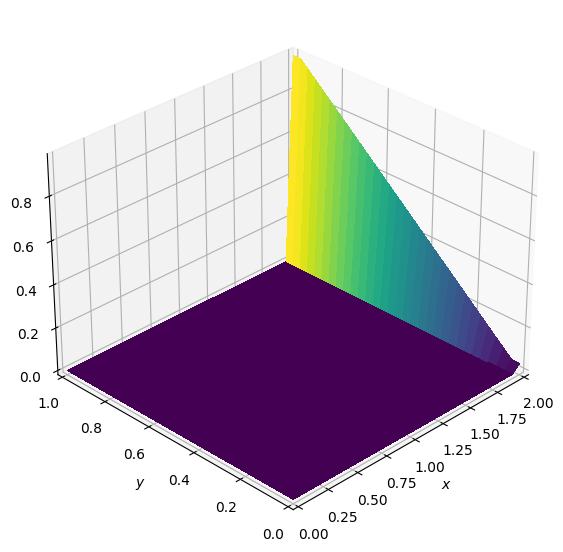

In [82]:
plot2D(x, y, p)

It worked! This is the initial state of our problem, where the value of $p$ is zero everywhere except for along $x=2$ where $p=y$. Now let's try to run our laplace2d function with a specified L1 target of .01

[Hint: if you are having trouble remembering the order in which variables are sent to a function, you can just type laplace2d( and the iPython Notebook will put up a little popup box to remind you]

In [83]:
p = laplace2d(p, y, dx, dy, 1e-4)

Now try plotting this new value of p with our plot function.

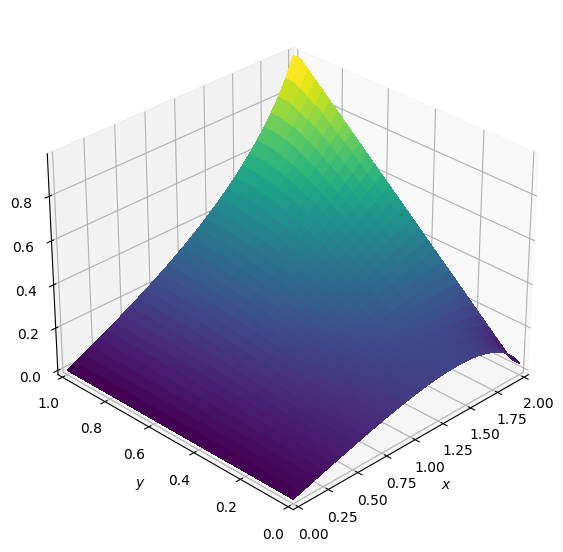

In [84]:
plot2D(x, y, p)

## 10. 2D Poisson Equation

Poisson's equation is obtained from adding a source term to the right-hand-side of Laplace's equation:
$$ \frac{\partial^{2} p}{ \partial x^{2}} + \frac{\partial^{2} p}{ \partial y^{2}}= b$$

So, unlinke the Laplace equation, there is some finite value inside the field that affects the solution. Poisson's equation acts to "relax" the initial sources in the field.

In discretized form, this looks almost the same as Step 9, except for the source term:

$$\frac{p^{n}_{i+1,j}- 2p^{n}_{i,j} + p^{n}_{i-1,j}}{\Delta x^{2}} + \frac{p^{n}_{i,j+1}- 2p^{n}_{i,j} + p^{n}_{i,j-1}}{\Delta y^{2}} =b^{n}_{i,j}$$

As before, we rearrange this so that we obtain an equation for $p$ at point $i,j$. Thus, we obtain:

$$p^{n}_{i,j} = \frac{\Delta x^{2} (p^{n}_{i,j+1} + p^{n}_{i,j-1}) + \Delta y^{2} (p^{n}_{i+1,j} + p^{n}_{i-1,j}) -b_{i,j}\Delta x^{2}\Delta y^{2}}{2(\Delta x^{2} + \Delta y^{2})}$$


We will solve this equation by assuming an initial state of p=0 everywhere, and applying boundary conditions as follows:

$p=0$ at $x=0, 2$ and $y=0, 1$
and the source term consists of two initial spikes inside the domain, as follows:

$b_{i,j}=100$ $\text{at}$ $i=\frac{1}{4}nx,j=\frac{1}{4}ny$

$b_{i,j}=−100$ $\text{at}$ $i=\frac{3}{4}nx,j=\frac{3}{4}ny$

$b_{i,j}=0$ $\text{everywhere else}$.

The iterations will advance in pseudo-time to relax the initial spikes. The relaxation under Poisson's equation gets slower and slower as they progress. Why?

Let's look at one possible way to write the code for Poisson's equation. As always, we load our favorite Python libraries. We also want to make some lovely plots in 3D. Let's get our parameters defined and the initialization out of the way. What do you notice of the approach below?

In [85]:
import numpy
from matplotlib import pyplot, cm
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline


In [86]:
# Parameters
nx = 50
ny = 50
nt  = 100
xmin = 0
xmax = 2
ymin = 0
ymax = 1

dx = (xmax - xmin) / (nx - 1)
dy = (ymax - ymin) / (ny - 1)

# Initialization
p  = numpy.zeros((ny, nx))
pd = numpy.zeros((ny, nx))
b  = numpy.zeros((ny, nx))
x  = numpy.linspace(xmin, xmax, nx)
y  = numpy.linspace(xmin, xmax, ny)

# Source
b[int(ny / 4), int(nx / 4)]  = 100
b[int(3 * ny / 4), int(3 * nx / 4)] = -100


With that, we are ready to advance the initial guess in pseudo-time. How is the code below different from the function used in Step 9 to solve Laplace's equation?



In [87]:
for it in range(nt):

    pd = p.copy()

    p[1:-1,1:-1] = (((pd[1:-1, 2:] + pd[1:-1, :-2]) * dy**2 +
                    (pd[2:, 1:-1] + pd[:-2, 1:-1]) * dx**2 -
                    b[1:-1, 1:-1] * dx**2 * dy**2) / 
                    (2 * (dx**2 + dy**2)))

    p[0, :] = 0
    p[ny-1, :] = 0
    p[:, 0] = 0
    p[:, nx-1] = 0

Maybe we could reuse our plotting function from Step 9, don't you think?

In [88]:
def plot2D(x, y, p):
    fig = pyplot.figure(figsize=(11, 7), dpi=100)
    ax = fig.gca(projection='3d')
    X, Y = numpy.meshgrid(x, y)
    surf = ax.plot_surface(X, Y, p[:], rstride=1, cstride=1, cmap=cm.viridis,
            linewidth=0, antialiased=False)
    ax.view_init(30, 225)
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')

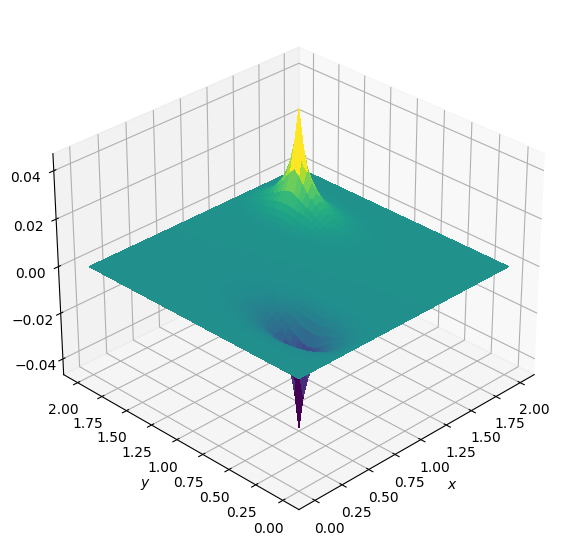

In [89]:
plot2D(x, y, p)

Ah! The wonders of code reuse! Now, you probably think: "Well, if I've written this neat little function that does something so useful, I want to use it over and over again. How can I do this without copying and pasting it each time? —If you are very curious about this, you'll have to learn about packaging. But this goes beyond the scope of our CFD lessons. You'll just have to Google it if you really want to know.

The final two steps in this interactive module teaching beginning CFD with Python will both solve the Navier–Stokes equations in two dimensions, but with different boundary conditions.

The momentum equation in vector form for a velocity field v⃗  is:

$$\frac{\partial \bar{v}}{ \partial t} +(\bar{v} \cdot \nabla) \bar{v} = -\frac{1}{\rho} \nabla p+ \nu \nabla^{2} \bar{v}$$
This represents three scalar equations, one for each velocity component (u,v,w). But we will solve it in two dimensions, so there will be two scalar equations.

Remember the continuity equation? This is where the Poisson equation for pressure comes in!

## 11. Cavity Flow with Navier–Stokes


Here is the system of differential equations: two equations for the velocity components u,v and one equation for pressure:

$$\frac{\partial u}{\partial t} + u \frac{\partial u}{\partial x} + v \frac{\partial u}{\partial y} = -\frac{1}{\rho}\frac{\partial p}{\partial x} + \nu (\frac{\partial^{2} u}{\partial x^{2}} + \frac{\partial^{2} u}{\partial y^{2}})$$


$$\frac{\partial v}{\partial t} + u \frac{\partial v}{\partial x} + v \frac{\partial v}{\partial y} = -\frac{1}{\rho}\frac{\partial p}{\partial y} + \nu (\frac{\partial^{2} v}{\partial x^{2}} + \frac{\partial^{2} v}{\partial y^{2}})$$


$$ \frac{\partial^{2} p}{ \partial x^{2}} + \frac{\partial^{2} p}{ \partial y^{2}}= -\rho(\frac{\partial u}{\partial x}\frac{\partial u}{\partial x} + 2\frac{\partial u}{ \partial y}\frac{\partial v}{\partial x} + \frac{\partial v}{\partial y}\frac{\partial v}{\partial y})$$

From the previous steps, we already know how to discretize all these terms. Only the last equation is a little unfamiliar. But with a little patience, it will not be hard!


## Discretized equations

First, let's discretize the u-momentum equation, as follows:

$$\frac{u^{n+1}_{i,j}- u^{n}_{i,j}}{\Delta t} +u^{n}_{i,j} \frac{u^{n}_{i,j}- u^{n}_{i-1,j}}{\Delta x} + v^{n}_{i,j} \frac{u^{n}_{i,j}- u^{n}_{i,j-1}}{\Delta y} = -\frac{1}{\rho}(\frac{p^{n}_{i+1,j}- p^{n}_{i-1,j}}{2\Delta x}) + \nu (\frac{u^{n}_{i+1,j}- 2u^{n}_{i,j} + u^{n}_{i-1,j}}{\Delta x^{2}} + \frac{u^{n}_{i,j+1}- 2u^{n}_{i,j} + u^{n}_{i,j-1}}{\Delta y^{2}})$$

Similarly for the v-momentum equation:

$$\frac{v^{n+1}_{i,j}- v^{n}_{i,j}}{\Delta t} +u^{n}_{i,j} \frac{v^{n}_{i,j}- v^{n}_{i-1,j}}{\Delta x} + v^{n}_{i,j} \frac{v^{n}_{i,j}- v^{n}_{i,j-1}}{\Delta y} = -\frac{1}{\rho}(\frac{p^{n}_{i,j+1}- p^{n}_{i, k-1}}{2\Delta y}) \nu (\frac{v^{n}_{i+1,j}- 2v^{n}_{i,j} + v^{n}_{i-1,j}}{\Delta x^{2}} + \frac{v^{n}_{i,j+1}- 2v^{n}_{i,j} + v^{n}_{i,j-1}}{\Delta y^{2}})$$

Finally, the discretized pressure-Poisson equation can be written thus:

$$ 
\frac{p^{n}_{i+1,j}- 2p^{n}_{i,j} + p^{n}_{i-1,j}}{\Delta x^{2}} + \frac{p^{n}_{i,j+1}- 2p^{n}_{i,j} + p^{n}_{i,j-1}}{\Delta y^{2}} = \rho [\frac{1}{\Delta t}(\frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x}-\frac{v_{i,j+1}- v_{i,j-1}}{2\Delta y})- \frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x}\frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x} - 2\frac{u_{i,j+1}- u_{i, j-1}}{2\Delta y}\frac{v_{i+1,j}- v_{i-1,j}}{2\Delta x} - \frac{v_{i,j+1}- v_{i,j-1}}{2\Delta y}\frac{v_{i,j+1}- v_{i,j-1}}{2 \Delta y}]$$



You should write these equations down on your own notes, by hand, following each term mentally as you write it.

As before, let's rearrange the equations in the way that the iterations need to proceed in the code. First, the momentum equations for the velocity at the next time step.

The momentum equation in the $u$ direction: 

$$u^{n+1}_{i,j} =u^{n}_{i,j} - u^{n}_{i,j}\frac{\Delta t}{\Delta x} (u^{n}_{i,j}- u^{n}_{i-1,j}) - 
\frac{\Delta t}{2\Delta x} (p^{n}_{i,j+1}- p^{n}_{i,j-1}) +
v^{n}_{i,j}\frac{\Delta t}{\Delta y} (u^{n}_{i,j}- u^{n}_{i,j-1}) + \nu \frac{\Delta t}{\Delta x^{2}} (u^{n}_{i+1,j}- 2u^{n}_{i,j} + u^{n}_{i-1,j}) + \nu \frac{\Delta t}{\Delta y^{2}} (u^{n}_{i, j+1}- 2u^{n}_{i,j} + u^{n}_{i,j-1})$$

The momentum equation in the $u$ direction: 

$$v^{n+1}_{i,j} = v^{n}_{i,j} - u^{n}_{i,j}\frac{\Delta t}{\Delta x} (v^{n}_{i,j}- v^{n}_{i-1,j}) - 
\frac{\Delta t}{2\Delta y} (p^{n}_{i,j+1}- p^{n}_{i,j-1}) +
v^{n}_{i,j}\frac{\Delta t}{\Delta y} (v^{n}_{i,j}- v^{n}_{i,j-1}) + \nu \frac{\Delta t}{\Delta x^{2}} (v^{n}_{i+1,j}- 2v^{n}_{i,j} + v^{n}_{i-1,j}) + \nu \frac{\Delta t}{\Delta y^{2}} (v^{n}_{i, j+1}- 2v^{n}_{i,j} + v^{n}_{i,j-1})$$


Almost there! Now, we rearrange the pressure-Poisson equation:

$$p^{n}_{i,j} = \frac{\Delta x^{2} (p^{n}_{i,j+1} + p^{n}_{i,j-1}) + \Delta y^{2} (p^{n}_{i+1,j} + p^{n}_{i-1,j})} {2(\Delta x^{2} + \Delta y^{2})} -\rho \frac{\Delta x^{2}\Delta y^{2}}{2(\Delta x^{2} + \Delta y^{2})}\times
[\frac{1}{\Delta t}(\frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x}-\frac{v_{i,j+1}- v_{i,j-1}}{2\Delta y})- \frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x}\frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x} - 2\frac{u_{i,j+1}- u_{i, j-1}}{2\Delta y}\frac{v_{i+1,j}- v_{i-1,j}}{2\Delta x} - \frac{v_{i,j+1}- v_{i,j-1}}{2\Delta y}\frac{v_{i,j+1}- v_{i,j-1}}{2 \Delta y}]$$


The initial condition is $u,v,p=0 $everywhere, and the boundary conditions are:

$u=1$ at $y=2$ (the "lid");

$u,v=0$ on the other boundaries;

$\frac{\partial{p}}{\partial{y}}=0$ at $y=0$;

$p=0$ at $y=2$
$\frac{\partial{p}}{\partial{x}}=0$ at $x=0, 2$;


## Implementing Cavity Flow

In [105]:
import numpy
from matplotlib import pyplot, cm
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline


In [106]:
nx = 41
ny = 41
nt = 500
nit = 50
c = 1
dx = 2 / (nx - 1)
dy = 2 / (ny - 1)
x = numpy.linspace(0, 2, nx)
y = numpy.linspace(0, 2, ny)
X, Y = numpy.meshgrid(x, y)

rho = 1
nu = .1
dt = .001

u = numpy.zeros((ny, nx))
v = numpy.zeros((ny, nx))
p = numpy.zeros((ny, nx)) 
b = numpy.zeros((ny, nx))

The pressure Poisson equation that's written above can be hard to write out without typos. The function build_up_b below represents the contents of the square brackets, so that the entirety of the PPE is slightly more manageable.

In [107]:
def build_up_b(b, rho, dt, u, v, dx, dy):
    
    b[1:-1, 1:-1] = (rho * (1 / dt * 
                    ((u[1:-1, 2:] - u[1:-1, 0:-2]) / 
                     (2 * dx) + (v[2:, 1:-1] - v[0:-2, 1:-1]) / (2 * dy)) -
                    ((u[1:-1, 2:] - u[1:-1, 0:-2]) / (2 * dx))**2 -
                      2 * ((u[2:, 1:-1] - u[0:-2, 1:-1]) / (2 * dy) *
                           (v[1:-1, 2:] - v[1:-1, 0:-2]) / (2 * dx))-
                          ((v[2:, 1:-1] - v[0:-2, 1:-1]) / (2 * dy))**2))

    return b

The function pressure_poisson is also defined to help segregate the different rounds of calculations. Note the presence of the pseudo-time variable nit. This sub-iteration in the Poisson calculation helps ensure a divergence-free field.

In [108]:
def pressure_poisson(p, dx, dy, b):
    pn = numpy.empty_like(p)
    pn = p.copy()
    
    for q in range(nit):
        pn = p.copy()
        p[1:-1, 1:-1] = (((pn[1:-1, 2:] + pn[1:-1, 0:-2]) * dy**2 + 
                          (pn[2:, 1:-1] + pn[0:-2, 1:-1]) * dx**2) /
                          (2 * (dx**2 + dy**2)) -
                          dx**2 * dy**2 / (2 * (dx**2 + dy**2)) * 
                          b[1:-1,1:-1])

        p[:, -1] = p[:, -2] # dp/dx = 0 at x = 2
        p[0, :] = p[1, :]   # dp/dy = 0 at y = 0
        p[:, 0] = p[:, 1]   # dp/dx = 0 at x = 0
        p[-1, :] = 0        # p = 0 at y = 2
        
    return p

Finally, the rest of the cavity flow equations are wrapped inside the function cavity_flow, allowing us to easily plot the results of the cavity flow solver for different lengths of time.

In [109]:
def cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu):
    un = numpy.empty_like(u)
    vn = numpy.empty_like(v)
    b = numpy.zeros((ny, nx))
    
    for n in range(nt):
        un = u.copy()
        vn = v.copy()
        
        b = build_up_b(b, rho, dt, u, v, dx, dy)
        p = pressure_poisson(p, dx, dy, b)
        
        u[1:-1, 1:-1] = (un[1:-1, 1:-1]-
                         un[1:-1, 1:-1] * dt / dx *
                        (un[1:-1, 1:-1] - un[1:-1, 0:-2]) -
                         vn[1:-1, 1:-1] * dt / dy *
                        (un[1:-1, 1:-1] - un[0:-2, 1:-1]) -
                         dt / (2 * rho * dx) * (p[1:-1, 2:] - p[1:-1, 0:-2]) +
                         nu * (dt / dx**2 *
                        (un[1:-1, 2:] - 2 * un[1:-1, 1:-1] + un[1:-1, 0:-2]) +
                         dt / dy**2 *
                        (un[2:, 1:-1] - 2 * un[1:-1, 1:-1] + un[0:-2, 1:-1])))

        v[1:-1,1:-1] = (vn[1:-1, 1:-1] -
                        un[1:-1, 1:-1] * dt / dx *
                       (vn[1:-1, 1:-1] - vn[1:-1, 0:-2]) -
                        vn[1:-1, 1:-1] * dt / dy *
                       (vn[1:-1, 1:-1] - vn[0:-2, 1:-1]) -
                        dt / (2 * rho * dy) * (p[2:, 1:-1] - p[0:-2, 1:-1]) +
                        nu * (dt / dx**2 *
                       (vn[1:-1, 2:] - 2 * vn[1:-1, 1:-1] + vn[1:-1, 0:-2]) +
                        dt / dy**2 *
                       (vn[2:, 1:-1] - 2 * vn[1:-1, 1:-1] + vn[0:-2, 1:-1])))

        u[0, :]  = 0
        u[:, 0]  = 0
        u[:, -1] = 0
        u[-1, :] = 1    # set velocity on cavity lid equal to 1
        v[0, :]  = 0
        v[-1, :] = 0
        v[:, 0]  = 0
        v[:, -1] = 0
        
        
    return u, v, p


Let's start with nt = 100 and see what the solver gives us:

In [110]:
u = numpy.zeros((ny, nx))
v = numpy.zeros((ny, nx))
p = numpy.zeros((ny, nx))
b = numpy.zeros((ny, nx))
nt = 100
u, v, p = cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu)


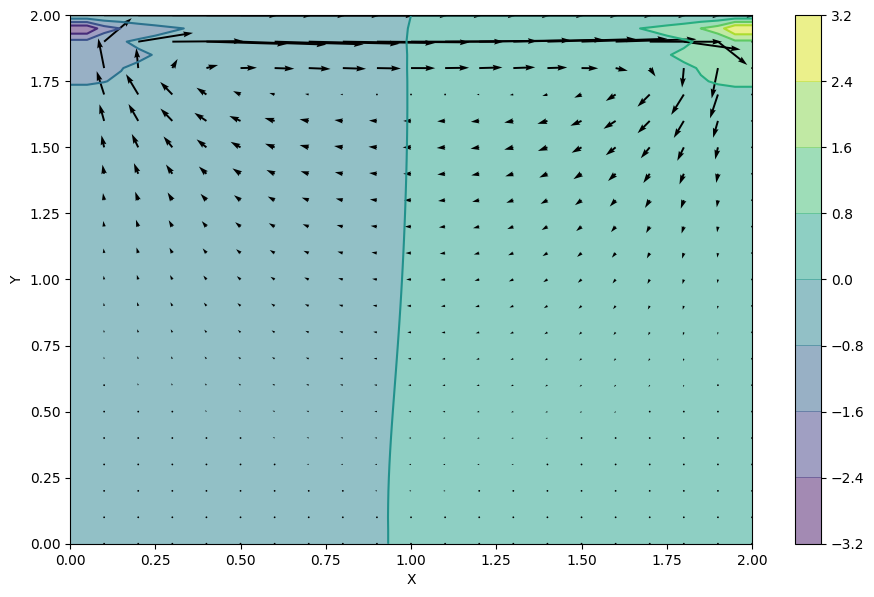

In [111]:
fig = pyplot.figure(figsize=(11,7), dpi=100)
# plotting the pressure field as a contour
pyplot.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)  
pyplot.colorbar()
# plotting the pressure field outlines
pyplot.contour(X, Y, p, cmap=cm.viridis)  
# plotting velocity field
pyplot.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2]) 
pyplot.xlabel('X')
pyplot.ylabel('Y');


You can see that two distinct pressure zones are forming and that the spiral pattern expected from lid-driven cavity flow is beginning to form. Experiment with different values of nt to see how long the system takes to stabilize.

In [112]:
u = numpy.zeros((ny, nx))
v = numpy.zeros((ny, nx))
p = numpy.zeros((ny, nx))
b = numpy.zeros((ny, nx))
nt = 700
u, v, p = cavity_flow(nt, u, v, dt, dx, dy, p, rho, nu)

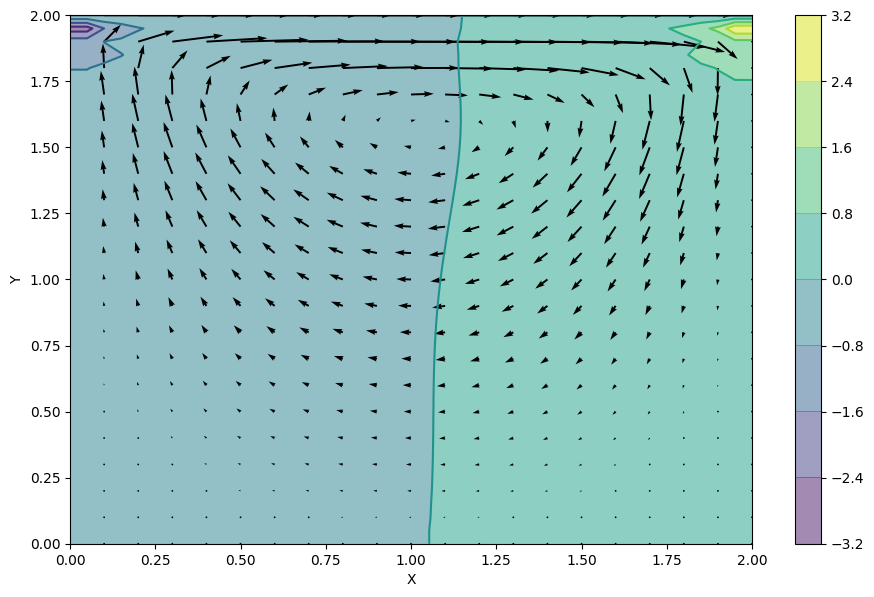

In [113]:
fig = pyplot.figure(figsize=(11, 7), dpi=100)
pyplot.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
pyplot.colorbar()
pyplot.contour(X, Y, p, cmap=cm.viridis)
pyplot.quiver(X[::2, ::2], Y[::2, ::2], u[::2, ::2], v[::2, ::2])
pyplot.xlabel('X')
pyplot.ylabel('Y');

The quiver plot shows the magnitude of the velocity at the discrete points in the mesh grid we created. (We're actually only showing half of the points because otherwise it's a bit of a mess. The X[::2, ::2] syntax above is a convenient way to ask for every other point.)

Another way to visualize the flow in the cavity is to use a streamplot:

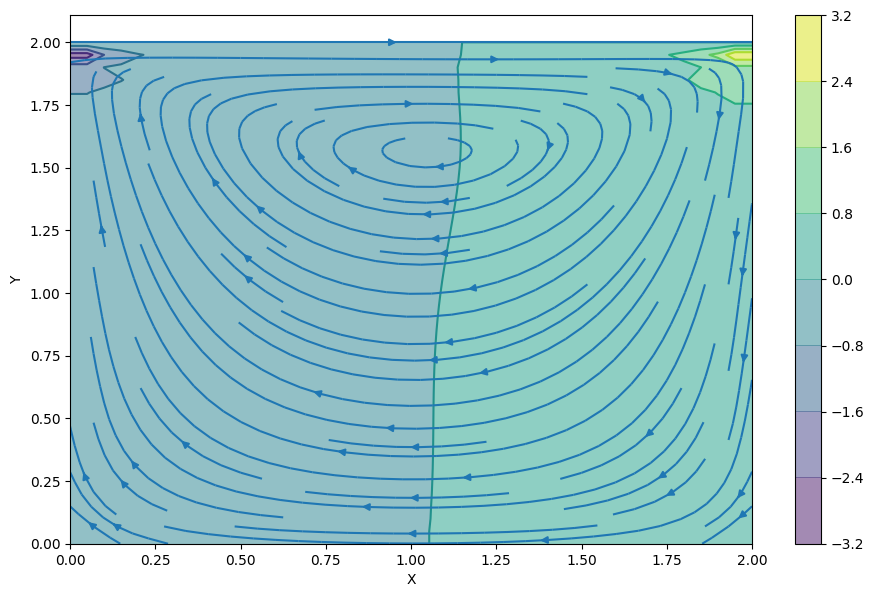

In [114]:
fig = pyplot.figure(figsize=(11, 7), dpi=100)
pyplot.contourf(X, Y, p, alpha=0.5, cmap=cm.viridis)
pyplot.colorbar()
pyplot.contour(X, Y, p, cmap=cm.viridis)
pyplot.streamplot(X, Y, u, v)
pyplot.xlabel('X')
pyplot.ylabel('Y');

## 12. Channel Flow with Navier–Stokes

The only difference between this final step and Step 11 is that we are going to add a source term to the u-momentum equation, to mimic the effect of a pressure-driven channel flow. Here are our modified Navier–Stokes equations:


$$\frac{\partial u}{\partial t} + u \frac{\partial u}{\partial x} + v \frac{\partial u}{\partial y} = -\frac{1}{\rho}\frac{\partial p}{\partial x} + \nu (\frac{\partial^{2} u}{\partial x^{2}} + \frac{\partial^{2} u}{\partial y^{2}}) + F$$


$$\frac{\partial v}{\partial t} + u \frac{\partial v}{\partial x} + v \frac{\partial v}{\partial y} = -\frac{1}{\rho}\frac{\partial p}{\partial y} + \nu (\frac{\partial^{2} v}{\partial x^{2}} + \frac{\partial^{2} v}{\partial y^{2}})$$


$$ \frac{\partial^{2} p}{ \partial x^{2}} + \frac{\partial^{2} p}{ \partial y^{2}}= -\rho(\frac{\partial u}{\partial x}\frac{\partial u}{\partial x} + 2\frac{\partial u}{ \partial y}\frac{\partial v}{\partial x} + \frac{\partial v}{\partial y}\frac{\partial v}{\partial y})$$


## Discretized equations

With patience and care, we write the discretized form of the equations. It is highly recommended that you write these in your own hand, mentally following each term as you write it.

The u-momentum equation:

$$\frac{u^{n+1}_{i,j}- u^{n}_{i,j}}{\Delta t} +u^{n}_{i,j} \frac{u^{n}_{i,j}- u^{n}_{i-1,j}}{\Delta x} + v^{n}_{i,j} \frac{u^{n}_{i,j}- u^{n}_{i,j-1}}{\Delta y} = -\frac{1}{\rho}(\frac{p^{n}_{i+1,j}- p^{n}_{i-1,j}}{2\Delta x}) + \nu (\frac{u^{n}_{i+1,j}- 2u^{n}_{i,j} + u^{n}_{i-1,j}}{\Delta x^{2}} + \frac{u^{n}_{i,j+1}- 2u^{n}_{i,j} + u^{n}_{i,j-1}}{\Delta y^{2}}) + F_{i,j}$$

The v-momentum equation:

$$\frac{v^{n+1}_{i,j}- v^{n}_{i,j}}{\Delta t} +u^{n}_{i,j} \frac{v^{n}_{i,j}- v^{n}_{i-1,j}}{\Delta x} + v^{n}_{i,j} \frac{v^{n}_{i,j}- v^{n}_{i,j-1}}{\Delta y} = -\frac{1}{\rho}(\frac{p^{n}_{i,j+1}- p^{n}_{i, k-1}}{2\Delta y}) \nu (\frac{v^{n}_{i+1,j}- 2v^{n}_{i,j} + v^{n}_{i-1,j}}{\Delta x^{2}} + \frac{v^{n}_{i,j+1}- 2v^{n}_{i,j} + v^{n}_{i,j-1}}{\Delta y^{2}})$$

And the pressure equation :

$$ 
\frac{p^{n}_{i+1,j}- 2p^{n}_{i,j} + p^{n}_{i-1,j}}{\Delta x^{2}} + \frac{p^{n}_{i,j+1}- 2p^{n}_{i,j} + p^{n}_{i,j-1}}{\Delta y^{2}} = \rho [\frac{1}{\Delta t}(\frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x}-\frac{v_{i,j+1}- v_{i,j-1}}{2\Delta y})- \frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x}\frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x} - 2\frac{u_{i,j+1}- u_{i, j-1}}{2\Delta y}\frac{v_{i+1,j}- v_{i-1,j}}{2\Delta x} - \frac{v_{i,j+1}- v_{i,j-1}}{2\Delta y}\frac{v_{i,j+1}- v_{i,j-1}}{2 \Delta y}]$$


As always, we need to re-arrange these equations to the form we need in the code to make the iterations proceed.

For the $u-$ and $v$ momentum equations, we isolate the velocity at time step $\textbf{n+1}$:

$$u^{n+1}_{i,j} =u^{n}_{i,j} - u^{n}_{i,j}\frac{\Delta t}{\Delta x} (u^{n}_{i,j}- u^{n}_{i-1,j}) - 
\frac{\Delta t}{2\Delta x} (p^{n}_{i,j+1}- p^{n}_{i,j-1}) +
v^{n}_{i,j}\frac{\Delta t}{\Delta y} (u^{n}_{i,j}- u^{n}_{i,j-1}) + \nu \frac{\Delta t}{\Delta x^{2}} (u^{n}_{i+1,j}- 2u^{n}_{i,j} + u^{n}_{i-1,j}) + \nu \frac{\Delta t}{\Delta y^{2}} (u^{n}_{i, j+1}- 2u^{n}_{i,j} + u^{n}_{i,j-1}) + \Delta t F$$


$$v^{n+1}_{i,j} = v^{n}_{i,j} - u^{n}_{i,j}\frac{\Delta t}{\Delta x} (v^{n}_{i,j}- v^{n}_{i-1,j}) - 
\frac{\Delta t}{2\Delta y} (p^{n}_{i,j+1}- p^{n}_{i,j-1}) +
v^{n}_{i,j}\frac{\Delta t}{\Delta y} (v^{n}_{i,j}- v^{n}_{i,j-1}) + \nu \frac{\Delta t}{\Delta x^{2}} (v^{n}_{i+1,j}- 2v^{n}_{i,j} + v^{n}_{i-1,j}) + \nu \frac{\Delta t}{\Delta y^{2}} (v^{n}_{i, j+1}- 2v^{n}_{i,j} + v^{n}_{i,j-1})$$

And for the pressure equation, we isolate the term $p^{n}_{i,j}$ to iterate in pseudo-time:

$$p^{n}_{i,j} = \frac{\Delta x^{2} (p^{n}_{i,j+1} + p^{n}_{i,j-1}) + \Delta y^{2} (p^{n}_{i+1,j} + p^{n}_{i-1,j})} {2(\Delta x^{2} + \Delta y^{2})} -\rho \frac{\Delta x^{2}\Delta y^{2}}{2(\Delta x^{2} + \Delta y^{2})}\times
[\frac{1}{\Delta t}(\frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x}-\frac{v_{i,j+1}- v_{i,j-1}}{2\Delta y})- \frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x}\frac{u_{i+1,j}- u_{i-1,j}}{2\Delta x} - 2\frac{u_{i,j+1}- u_{i, j-1}}{2\Delta y}\frac{v_{i+1,j}- v_{i-1,j}}{2\Delta x} - \frac{v_{i,j+1}- v_{i,j-1}}{2\Delta y}\frac{v_{i,j+1}- v_{i,j-1}}{2 \Delta y}]$$


The initial condition is $u,v,p=0$ everywhere, and at the boundary conditions are:

$u,v,p$ are periodic on $x=0,2$

$u,v=0$ at $y=0,2$

$\frac{\partial p}{\partial y}=0 $ at $y=0,2$

$F=1$ everywhere.

Let's begin by importing our usual run of libraries:

In [115]:
import numpy
from matplotlib import pyplot, cm
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

In step 11, we isolated a portion of our transposed equation to make it easier to parse and we're going to do the same thing here. One thing to note is that we have periodic boundary conditions throughout this grid, so we need to explicitly calculate the values at the leading and trailing edge of our u vector.

In [116]:
def build_up_b(rho, dt, dx, dy, u, v):
    b = numpy.zeros_like(u)
    b[1:-1, 1:-1] = (rho * (1 / dt * ((u[1:-1, 2:] - u[1:-1, 0:-2]) / (2 * dx) +
                                      (v[2:, 1:-1] - v[0:-2, 1:-1]) / (2 * dy)) -
                            ((u[1:-1, 2:] - u[1:-1, 0:-2]) / (2 * dx))**2 -
                            2 * ((u[2:, 1:-1] - u[0:-2, 1:-1]) / (2 * dy) *
                                 (v[1:-1, 2:] - v[1:-1, 0:-2]) / (2 * dx))-
                            ((v[2:, 1:-1] - v[0:-2, 1:-1]) / (2 * dy))**2))
    
    # Periodic BC Pressure @ x = 2
    b[1:-1, -1] = (rho * (1 / dt * ((u[1:-1, 0] - u[1:-1,-2]) / (2 * dx) +
                                    (v[2:, -1] - v[0:-2, -1]) / (2 * dy)) -
                          ((u[1:-1, 0] - u[1:-1, -2]) / (2 * dx))**2 -
                          2 * ((u[2:, -1] - u[0:-2, -1]) / (2 * dy) *
                               (v[1:-1, 0] - v[1:-1, -2]) / (2 * dx)) -
                          ((v[2:, -1] - v[0:-2, -1]) / (2 * dy))**2))

    # Periodic BC Pressure @ x = 0
    b[1:-1, 0] = (rho * (1 / dt * ((u[1:-1, 1] - u[1:-1, -1]) / (2 * dx) +
                                   (v[2:, 0] - v[0:-2, 0]) / (2 * dy)) -
                         ((u[1:-1, 1] - u[1:-1, -1]) / (2 * dx))**2 -
                         2 * ((u[2:, 0] - u[0:-2, 0]) / (2 * dy) *
                              (v[1:-1, 1] - v[1:-1, -1]) / (2 * dx))-
                         ((v[2:, 0] - v[0:-2, 0]) / (2 * dy))**2))
    
    return b

We'll also define a Pressure Poisson iterative function, again like we did in Step 11. Once more, note that we have to include the periodic boundary conditions at the leading and trailing edge. We also have to specify the boundary conditions at the top and bottom of our grid.

In [117]:
def pressure_poisson_periodic(p, dx, dy):
    pn = numpy.empty_like(p)
    
    for q in range(nit):
        pn = p.copy()
        p[1:-1, 1:-1] = (((pn[1:-1, 2:] + pn[1:-1, 0:-2]) * dy**2 +
                          (pn[2:, 1:-1] + pn[0:-2, 1:-1]) * dx**2) /
                         (2 * (dx**2 + dy**2)) -
                         dx**2 * dy**2 / (2 * (dx**2 + dy**2)) * b[1:-1, 1:-1])

        # Periodic BC Pressure @ x = 2
        p[1:-1, -1] = (((pn[1:-1, 0] + pn[1:-1, -2])* dy**2 +
                        (pn[2:, -1] + pn[0:-2, -1]) * dx**2) /
                       (2 * (dx**2 + dy**2)) -
                       dx**2 * dy**2 / (2 * (dx**2 + dy**2)) * b[1:-1, -1])

        # Periodic BC Pressure @ x = 0
        p[1:-1, 0] = (((pn[1:-1, 1] + pn[1:-1, -1])* dy**2 +
                       (pn[2:, 0] + pn[0:-2, 0]) * dx**2) /
                      (2 * (dx**2 + dy**2)) -
                      dx**2 * dy**2 / (2 * (dx**2 + dy**2)) * b[1:-1, 0])
        
        # Wall boundary conditions, pressure
        p[-1, :] =p[-2, :]  # dp/dy = 0 at y = 2
        p[0, :] = p[1, :]  # dp/dy = 0 at y = 0
    
    return p


Now we have our familiar list of variables and initial conditions to declare before we start.

In [118]:
##variable declarations
nx = 41
ny = 41
nt = 10
nit = 50 
c = 1
dx = 2 / (nx - 1)
dy = 2 / (ny - 1)
x = numpy.linspace(0, 2, nx)
y = numpy.linspace(0, 2, ny)
X, Y = numpy.meshgrid(x, y)


##physical variables
rho = 1
nu = .1
F = 1
dt = .01

#initial conditions
u = numpy.zeros((ny, nx))
un = numpy.zeros((ny, nx))

v = numpy.zeros((ny, nx))
vn = numpy.zeros((ny, nx))

p = numpy.ones((ny, nx))
pn = numpy.ones((ny, nx))

b = numpy.zeros((ny, nx))

For the meat of our computation, we're going to reach back to a trick we used in Step 9 for Laplace's Equation. We're interested in what our grid will look like once we've reached a near-steady state. We can either specify a number of timesteps nt and increment it until we're satisfied with the results, or we can tell our code to run until the difference between two consecutive iterations is very small.

We also have to manage 8 separate boundary conditions for each iteration. The code below writes each of them out explicitly. If you're interested in a challenge, you can try to write a function which can handle some or all of these boundary conditions. If you're interested in tackling that, you should probably read up on Python dictionaries.

In [119]:
udiff = 1
stepcount = 0

while udiff > .001:
    un = u.copy()
    vn = v.copy()

    b = build_up_b(rho, dt, dx, dy, u, v)
    p = pressure_poisson_periodic(p, dx, dy)

    u[1:-1, 1:-1] = (un[1:-1, 1:-1] -
                     un[1:-1, 1:-1] * dt / dx * 
                    (un[1:-1, 1:-1] - un[1:-1, 0:-2]) -
                     vn[1:-1, 1:-1] * dt / dy * 
                    (un[1:-1, 1:-1] - un[0:-2, 1:-1]) -
                     dt / (2 * rho * dx) * 
                    (p[1:-1, 2:] - p[1:-1, 0:-2]) +
                     nu * (dt / dx**2 * 
                    (un[1:-1, 2:] - 2 * un[1:-1, 1:-1] + un[1:-1, 0:-2]) +
                     dt / dy**2 * 
                    (un[2:, 1:-1] - 2 * un[1:-1, 1:-1] + un[0:-2, 1:-1])) + 
                     F * dt)

    v[1:-1, 1:-1] = (vn[1:-1, 1:-1] -
                     un[1:-1, 1:-1] * dt / dx * 
                    (vn[1:-1, 1:-1] - vn[1:-1, 0:-2]) -
                     vn[1:-1, 1:-1] * dt / dy * 
                    (vn[1:-1, 1:-1] - vn[0:-2, 1:-1]) -
                     dt / (2 * rho * dy) * 
                    (p[2:, 1:-1] - p[0:-2, 1:-1]) +
                     nu * (dt / dx**2 *
                    (vn[1:-1, 2:] - 2 * vn[1:-1, 1:-1] + vn[1:-1, 0:-2]) +
                     dt / dy**2 * 
                    (vn[2:, 1:-1] - 2 * vn[1:-1, 1:-1] + vn[0:-2, 1:-1])))

    # Periodic BC u @ x = 2     
    u[1:-1, -1] = (un[1:-1, -1] - un[1:-1, -1] * dt / dx * 
                  (un[1:-1, -1] - un[1:-1, -2]) -
                   vn[1:-1, -1] * dt / dy * 
                  (un[1:-1, -1] - un[0:-2, -1]) -
                   dt / (2 * rho * dx) *
                  (p[1:-1, 0] - p[1:-1, -2]) + 
                   nu * (dt / dx**2 * 
                  (un[1:-1, 0] - 2 * un[1:-1,-1] + un[1:-1, -2]) +
                   dt / dy**2 * 
                  (un[2:, -1] - 2 * un[1:-1, -1] + un[0:-2, -1])) + F * dt)

    # Periodic BC u @ x = 0
    u[1:-1, 0] = (un[1:-1, 0] - un[1:-1, 0] * dt / dx *
                 (un[1:-1, 0] - un[1:-1, -1]) -
                  vn[1:-1, 0] * dt / dy * 
                 (un[1:-1, 0] - un[0:-2, 0]) - 
                  dt / (2 * rho * dx) * 
                 (p[1:-1, 1] - p[1:-1, -1]) + 
                  nu * (dt / dx**2 * 
                 (un[1:-1, 1] - 2 * un[1:-1, 0] + un[1:-1, -1]) +
                  dt / dy**2 *
                 (un[2:, 0] - 2 * un[1:-1, 0] + un[0:-2, 0])) + F * dt)

    # Periodic BC v @ x = 2
    v[1:-1, -1] = (vn[1:-1, -1] - un[1:-1, -1] * dt / dx *
                  (vn[1:-1, -1] - vn[1:-1, -2]) - 
                   vn[1:-1, -1] * dt / dy *
                  (vn[1:-1, -1] - vn[0:-2, -1]) -
                   dt / (2 * rho * dy) * 
                  (p[2:, -1] - p[0:-2, -1]) +
                   nu * (dt / dx**2 *
                  (vn[1:-1, 0] - 2 * vn[1:-1, -1] + vn[1:-1, -2]) +
                   dt / dy**2 *
                  (vn[2:, -1] - 2 * vn[1:-1, -1] + vn[0:-2, -1])))

    # Periodic BC v @ x = 0
    v[1:-1, 0] = (vn[1:-1, 0] - un[1:-1, 0] * dt / dx *
                 (vn[1:-1, 0] - vn[1:-1, -1]) -
                  vn[1:-1, 0] * dt / dy *
                 (vn[1:-1, 0] - vn[0:-2, 0]) -
                  dt / (2 * rho * dy) * 
                 (p[2:, 0] - p[0:-2, 0]) +
                  nu * (dt / dx**2 * 
                 (vn[1:-1, 1] - 2 * vn[1:-1, 0] + vn[1:-1, -1]) +
                  dt / dy**2 * 
                 (vn[2:, 0] - 2 * vn[1:-1, 0] + vn[0:-2, 0])))


    # Wall BC: u,v = 0 @ y = 0,2
    u[0, :] = 0
    u[-1, :] = 0
    v[0, :] = 0
    v[-1, :]=0
    
    udiff = (numpy.sum(u) - numpy.sum(un)) / numpy.sum(u)
    stepcount += 1

You can see that we've also included a variable stepcount to see how many iterations our loop went through before our stop condition was met.

In [120]:
print(stepcount)

499


If you want to see how the number of iterations increases as our udiff condition gets smaller and smaller, try defining a function to perform the while loop written above that takes an input udiff and outputs the number of iterations that the function runs.

For now, let's look at our results. We've used the quiver function to look at the cavity flow results and it works well for channel flow, too.

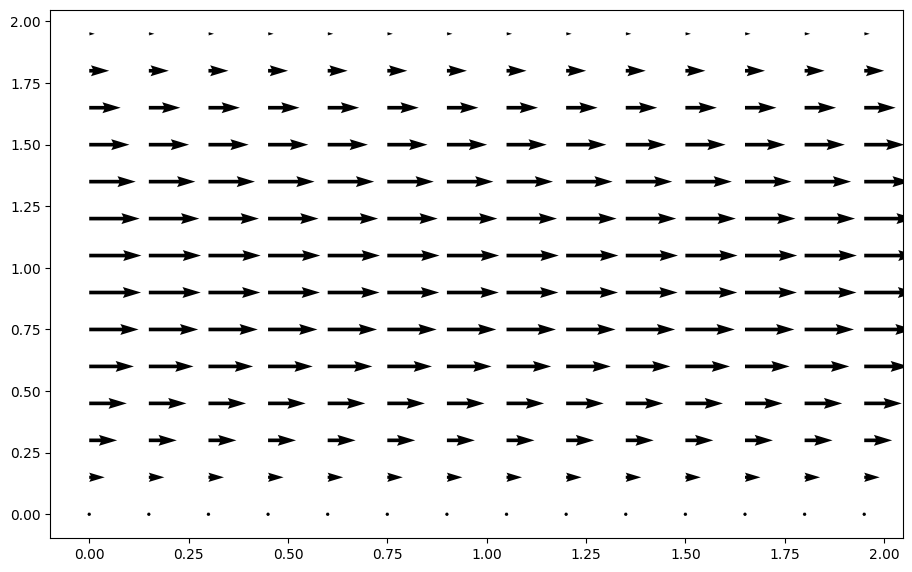

In [121]:
fig = pyplot.figure(figsize = (11,7), dpi=100)
pyplot.quiver(X[::3, ::3], Y[::3, ::3], u[::3, ::3], v[::3, ::3]);

The structures in the quiver command that look like [::3, ::3] are useful when dealing with large amounts of data that you want to visualize. The one used above tells matplotlib to only plot every 3rd data point. If we leave it out, you can see that the results can appear a little crowded.

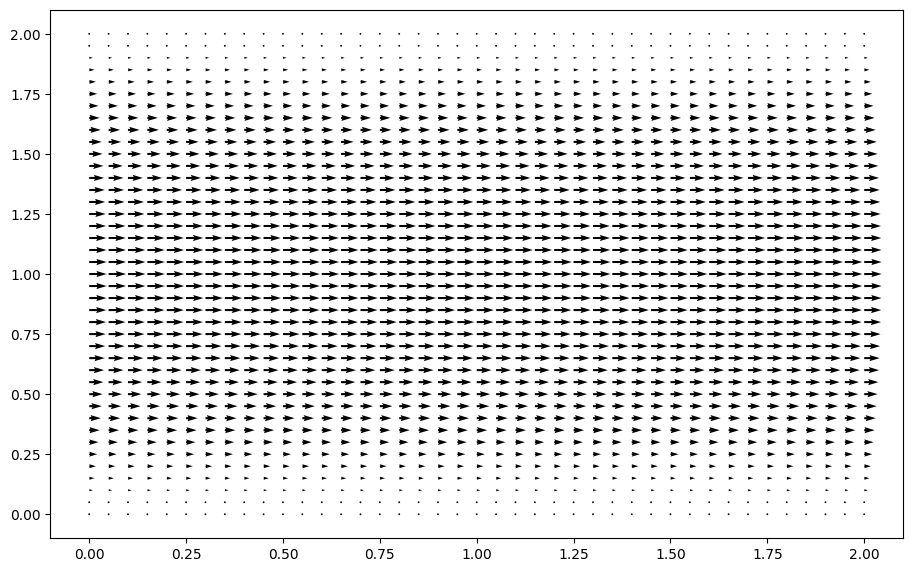

In [122]:
fig = pyplot.figure(figsize = (11,7), dpi=100)
pyplot.quiver(X, Y, u, v);

What is the meaning of the F term?
Step 12 is an exercise demonstrating the problem of flow in a channel or pipe. If you recall from your fluid mechanics class, a specified pressure gradient is what drives Poisseulle flow.

Recall the x-momentum equation:

∂u∂t+u⋅∇u=−∂p∂x+ν∇2u
What we actually do in Step 12 is split the pressure into steady and unsteady components p=P+p′. The applied steady pressure gradient is the constant −∂P∂x=F (interpreted as a source term), and the unsteady component is ∂p′∂x. So the pressure that we solve for in Step 12 is actually p′, which for a steady flow is in fact equal to zero everywhere.

Why did we do this?

Note that we use periodic boundary conditions for this flow. For a flow with a constant pressure gradient, the value of pressure on the left edge of the domain must be different from the pressure at the right edge. So we cannot apply periodic boundary conditions on the pressure directly. It is easier to fix the gradient and then solve for the perturbations in pressure.

Shouldn't we always expect a uniform/constant p′ then?

That's true only in the case of steady laminar flows. At high Reynolds numbers, flows in channels can become turbulent, and we will see unsteady fluctuations in the pressure, which will result in non-zero values for p′.

In step 12, note that the pressure field itself is not constant, but it's the pressure perturbation field that is. The pressure field varies linearly along the channel with slope equal to the pressure gradient. Also, for incompressible flows, the absolute value of the pressure is inconsequential.

## Boussinesque Equation

## Euler Equation